**SETUP**

In [1]:
import os
from PIL import Image
from torch.utils.data import Dataset
from torchvision import transforms

In [2]:
!ls

archive.zip  sample_data


In [3]:
!python -c "import monai" || pip install -q "monai-weekly[pillow, tqdm]"
!python -c "import matplotlib" || pip install -q matplotlib
%matplotlib inline

Traceback (most recent call last):
  File "<string>", line 1, in <module>
ModuleNotFoundError: No module named 'monai'
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.5/1.5 MB 42.6 MB/s eta 0:00:00


In [4]:
!pip install kornia

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 899.4/899.4 kB 39.9 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 79.7 MB/s eta 0:00:00


In [5]:
import os
import shutil
import tempfile
import matplotlib.pyplot as plt
import PIL
import random
from tqdm import tqdm
import zipfile
import torch
import kornia
import torch.nn as nn
import torch.optim as optim
from torch.utils.tensorboard import SummaryWriter
from torchvision.transforms import ToTensor
from monai.transforms import EnsureType
import numpy as np
from sklearn.metrics import classification_report
import cv2

from monai.data import MetaTensor
import monai
from monai.apps import download_and_extract
from monai.config import print_config
from monai.data import decollate_batch, DataLoader
from monai.metrics import ROCAUCMetric
from monai.networks.nets import DenseNet121
from monai.transforms import (
    Activations,
    EnsureChannelFirst,
    AsDiscrete,
    Compose,
    LoadImage,
    RandFlip,
    RandRotate,
    RandZoom,
    ScaleIntensity,
    Resize,
    GaussianSmooth,
    Lambda

)
from monai.utils import set_determinism

print_config()

MONAI version: 1.5.dev2452
Numpy version: 1.26.4
Pytorch version: 2.5.1+cu121
MONAI flags: HAS_EXT = False, USE_COMPILED = False, USE_META_DICT = False
MONAI rev id: 889d81d09ea262ecaea1104224473012cab33a42
MONAI __file__: /usr/local/lib/python3.10/dist-packages/monai/__init__.py

Optional dependencies:
Pytorch Ignite version: NOT INSTALLED or UNKNOWN VERSION.
ITK version: NOT INSTALLED or UNKNOWN VERSION.
Nibabel version: 5.3.2
scikit-image version: 0.25.0
scipy version: 1.13.1
Pillow version: 11.0.0
Tensorboard version: 2.17.1
gdown version: 5.2.0
TorchVision version: 0.20.1+cu121
tqdm version: 4.67.1
lmdb version: NOT INSTALLED or UNKNOWN VERSION.
psutil version: 5.9.5
pandas version: 2.2.2
einops version: 0.8.0
transformers version: 4.47.1
mlflow version: NOT INSTALLED or UNKNOWN VERSION.
pynrrd version: NOT INSTALLED or UNKNOWN VERSION.
clearml version: NOT INSTALLED or UNKNOWN VERSION.

For details about installing the optional dependencies, please visit:
    https://docs.monai.i

In [6]:
# Setăm variabila de mediu MONAI_DATA_DIRECTORY
os.environ["MONAI_DATA_DIRECTORY"] = "MONAI"

# Verificăm că variabila a fost setată corect
directory = os.environ.get("MONAI_DATA_DIRECTORY")
if directory is not None:
    os.makedirs(directory, exist_ok=True)
root_dir = tempfile.mkdtemp() if directory is None else directory
print(root_dir)

MONAI


In [7]:
root_dir = "/content"
compressed_file = os.path.join(root_dir, "archive.zip")
data_dir_train = os.path.join(root_dir, "Training")

if not os.path.exists(data_dir_train):
    with zipfile.ZipFile(compressed_file, "r") as zip_ref:
        zip_ref.extractall(path=root_dir)

In [8]:
extracted_files_train = os.listdir(data_dir_train)
print("Fisiere si directoare extrase:")
print(extracted_files_train)

Fisiere si directoare extrase:
['no_tumor', 'meningioma_tumor', 'pituitary_tumor', 'glioma_tumor']


In [9]:
root_dir = "/content"
compressed_file = os.path.join(root_dir, "archive.zip")
data_dir_test = os.path.join(root_dir, "Testing")

if not os.path.exists(data_dir_test):
    with zipfile.ZipFile(compressed_file, "r") as zip_ref:
        zip_ref.extractall(path=root_dir)

In [10]:
extracted_files_test = os.listdir(data_dir_test)
print("Fisiere si directoare extrase:")
print(extracted_files_test)

Fisiere si directoare extrase:
['no_tumor', 'meningioma_tumor', 'pituitary_tumor', 'glioma_tumor']


In [11]:
set_determinism(seed=42)

**SELECTARE IMAGINI SI CLASE PENTRU TRAIN**

In [12]:
class_names_train = sorted(x for x in os.listdir(data_dir_train) if os.path.isdir(os.path.join(data_dir_train, x)))
num_class_train = len(class_names_train)
image_files_train = [
    [os.path.join(data_dir_train, class_names_train[i], x) for x in os.listdir(os.path.join(data_dir_train, class_names_train[i]))]
    for i in range(num_class_train)
]
num_each_train = [len(image_files_train[i]) for i in range(num_class_train)]
image_files_list_train = []
image_class_train = []
for i in range(num_class_train):
    image_files_list_train.extend(image_files_train[i])
    image_class_train.extend([i] * num_each_train[i])
num_total_train = len(image_class_train)
image_width_train, image_height_train = PIL.Image.open(image_files_list_train[0]).size

print(f"Total image count: {num_total_train}")
print(f"Image dimensions: {image_width_train} x {image_height_train}")
print(f"Label names: {num_class_train}")
print(f"Label counts: {num_each_train}")


Total image count: 2870
Image dimensions: 512 x 512
Label names: 4
Label counts: [826, 822, 395, 827]


**SELECTARE IMAGINI SI CLASE PENTRU TEST**

In [13]:
class_names_test = sorted(x for x in os.listdir(data_dir_test) if os.path.isdir(os.path.join(data_dir_test, x)))
num_class_test = len(class_names_test)
image_files_test = [
    [os.path.join(data_dir_test, class_names_test[i], x) for x in os.listdir(os.path.join(data_dir_test, class_names_test[i]))]
    for i in range(num_class_test)
]
num_each_test = [len(image_files_test[i]) for i in range(num_class_test)]
image_files_list_test = []
image_class_test = []
for i in range(num_class_test):
    image_files_list_test.extend(image_files_test[i])
    image_class_test.extend([i] * num_each_test[i])
num_total_test = len(image_class_test)
image_width_test, image_height_test = PIL.Image.open(image_files_list_test[0]).size

print(f"Total image count: {num_total_test}")
print(f"Image dimensions: {image_width_test} x {image_height_test}")
print(f"Label names: {class_names_test}")
print(f"Label counts: {num_each_test}")


Total image count: 394
Image dimensions: 495 x 619
Label names: ['glioma_tumor', 'meningioma_tumor', 'no_tumor', 'pituitary_tumor']
Label counts: [100, 115, 105, 74]


**CERINTA 1**

In [14]:
class BrainTumorDataset(torch.utils.data.Dataset):
    def __init__(self, image_files, labels, transforms):
        self.image_files = image_files # lista catre caile de fisiere de imagini
        self.labels = labels # label-urile sau etichetele
        self.transforms = transforms # transgoramrile

    def __len__(self):
       # returnam numarul total de imagini
       return len(self.image_files)

    def __getitem__(self, index):
        # preluam calea catre imagine din fisierele de imagini
        image_file = self.image_files[index]
        # Aplicăm transformările pe imaginea selectata
        image = self.transforms(image_file)
        # preluam labelul indexului primit ca parametru
        label = self.labels[index]
        return image, label

**CERINTA 2**

In [15]:
length = len(image_files_list_train)
indices = np.arange(length)
np.random.shuffle(indices)

train_split = int(0.8 * length) # impartirea setului de date in 80% antrenare si 20% validare
train_indices = indices[:train_split] # preluarea indicilor pentru setul de antrenare
val_indices = indices[train_split:] # preluarea indicilor pentru setul de validare

train_x = [image_files_list_train[i] for i in train_indices] # salvarea imaginilor conform split-ului in train_x
train_y = [image_class_train[i] for i in train_indices] # salvarea etichetelor conform split-ului in train_y

val_x = [image_files_list_train[i] for i in val_indices] # salvarea imaginilor conform split-ului in val_x
val_y = [image_class_train[i] for i in val_indices] # salvarea etichetelor conform split-ului in val_y

# setul de testare a ramas intact
test_x = image_files_list_test
test_y = image_class_test

print(f"Train set: {len(train_x)} imagini")
print(f"Validation set: {len(val_x)} imagini")
print(f"Test set: {len(test_x)} imagini")

# CREARE FOLDER SEPARAT PENTRU VALIDATE

data_dir_val = os.path.join(root_dir, "Validate")
os.makedirs(data_dir_val, exist_ok=True)

# Obținem numele claselor pentru validare, identice cu cele de antrenament
class_names_val = class_names_train  # Folosim aceleași nume de clase ca în antrenament pentru ca sunt aceleasi nume de clase atat la train cat si la test
num_class_val = len(class_names_val)

# Cream subdirectoare pentru fiecare clasa în directorul de validare
for class_name in class_names_val:
    class_folder = os.path.join(data_dir_val, class_name)
    os.makedirs(class_folder, exist_ok=True)

# Copiem imaginile din `val_x` în subdirectoarele corespunzătoare, pe baza etichetelor din `val_y`
image_files_val = [[] for _ in range(num_class_val)]
for img_path, label in zip(val_x, val_y):
    class_folder = os.path.join(data_dir_val, class_names_val[label])
    dest_path = os.path.join(class_folder, os.path.basename(img_path))
    shutil.copy(img_path, dest_path)  # Copiază imaginea în directorul de clasa corespunzător
    image_files_val[label].append(dest_path)

# Calculul numarului de imagini pentru fiecare clasa în setul de validare și dimensiunea totala
num_each_val = [len(image_files_val[i]) for i in range(num_class_val)]
image_files_list_val = [img for sublist in image_files_val for img in sublist]
image_class_val = [i for i, count in enumerate(num_each_val) for _ in range(count)]
num_total_val = len(image_class_val)
image_width_val, image_height_val = Image.open(image_files_list_val[0]).size

print(f"Total image count in validation set: {num_total_val}")
print(f"Image dimensions: {image_width_val} x {image_height_val}")
print(f"Label names: {class_names_val}")
print(f"Label counts: {num_each_val}")

Train set: 2296 imagini
Validation set: 574 imagini
Test set: 394 imagini
Total image count in validation set: 574
Image dimensions: 512 x 512
Label names: ['glioma_tumor', 'meningioma_tumor', 'no_tumor', 'pituitary_tumor']
Label counts: [151, 175, 77, 171]


**CERINTA 3**

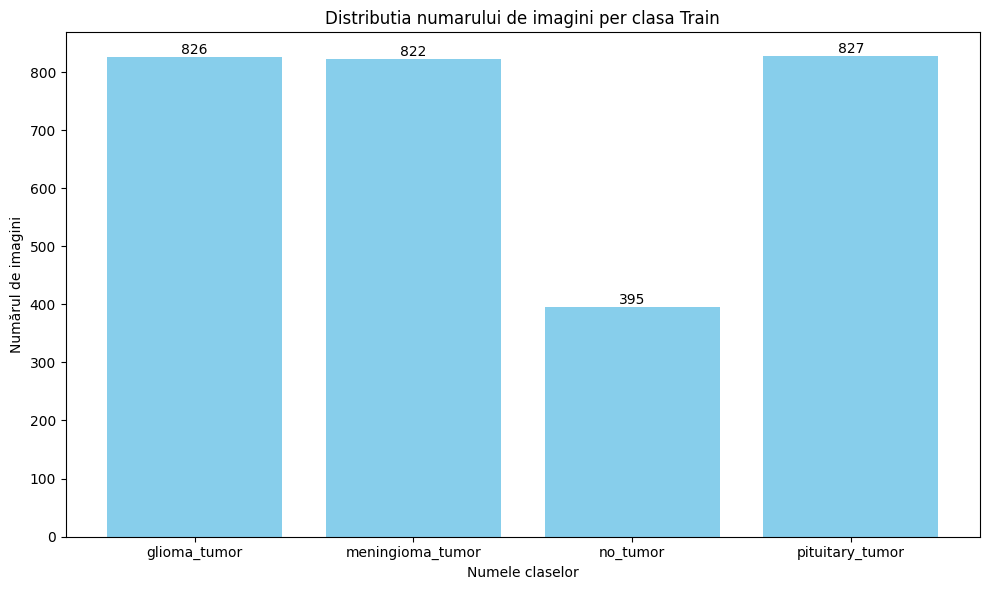

In [16]:
plt.figure(figsize=(10, 6))
plt.bar(class_names_train, num_each_train, color='skyblue') # afisare barplot pentru fiecare clasa din setul de antrenare pe baza la numarul de elemente din fiecare clasa

plt.title('Distributia numarului de imagini per clasa Train')
plt.xlabel('Numele claselor')
plt.ylabel('Numărul de imagini')

for i, count in enumerate(num_each_train):
    plt.text(i, count + 0.5, str(count), ha='center', va='bottom') # afisarea numarului de elemente din fiecare clasa deasupra barplotului clasei corespunzatoare

plt.tight_layout()
plt.show()

**APLICAREA DE AUGUMENTARI PE CLASELE DEFICITARE PENTRU TRAIN**

In [17]:
# # aplicarea de transformari pe clasele cu numar de elemente deficitar in comparatie cu celelalte clase
# # transformarile presupun : Rotirea imaginii, inversarea imaginii, aplicarea unei tente de luminozitate si contrast si decuparea unei parti din imagine dupa care redimensionarea acesteia la dimensiunile initiale ale imaginii

# def augment_image(image):

#     image = image.rotate(random.randint(-20, 20)) # rotirea imaginii
#     image = image.transpose(Image.FLIP_LEFT_RIGHT)  # Inversarea imaginii

#     enhancer = PIL.ImageEnhance.Brightness(image)
#     image = enhancer.enhance(random.uniform(0.7, 1.3)) # aplicarea unei tente de luminozitate

#     enhancer = PIL.ImageEnhance.Contrast(image)
#     image = enhancer.enhance(random.uniform(0.8, 1.2)) # aplicarea unei tente de contrast

#     width, height = image.size
#     zoom_factor = 0.9 # aleg o unitate de masura de concentrare (zoom) asupra partii decupate din imagine
#     left = int((width - width * zoom_factor) / 2) # definirea coordonatelor de decupare a unui "dreptunghi" din imagine, aici "tai" de pe laterala
#     top = int((height - height * zoom_factor) / 2) # aici "tai" sus si jos
#     right = int(left + width * zoom_factor) # "tai" pe partea dreapta
#     bottom = int(top + height * zoom_factor) # "tai" pentru partea de jos
#     image = image.crop((left, top, right, bottom)).resize((width, height)) # decuparea unei parti din imagine si redimensionarea acesteia la dimensiunile imaginii in scopul salvarii acesteia ca o imagine noua

#     return image

In [18]:
# deficit_number_no_tumor = num_each_train[3] - num_each_train[2] # calcularea numarului de imagini lipsa pentru train
# no_tumor_dir = os.path.join(data_dir_train, 'no_tumor') # preluarea directorului ce contine imaginile lipsa pentru train, am ales aceasta clasa de imagini pe baza distributiei barplot de mai sus pentru train
# no_tumor_images = [os.path.join(no_tumor_dir, img) for img in os.listdir(no_tumor_dir) if img.endswith(('jpg', 'jpeg', 'png'))] # preluarea imaginilor
# print(len(no_tumor_images))

In [19]:
# for i in tqdm(range(deficit_number_no_tumor), desc="Generating augmented images"):
#     img_path = no_tumor_images[i % len(no_tumor_images)] # preluarea cailor catre imagini
#     img = Image.open(img_path) # accesarea imaginii

#     augmented_img = augment_image(img) # aplicarea augumentarilor pe imaginea respectiva
#     augmented_img.save(os.path.join(no_tumor_dir, f"augmented_no_tumor_{i}.jpg")) # salvarea imaginii augumentate in acelasi director cu imaginile clasei, cu numar lipsa de elemente
#                                                                                   # imaginile sub salvate cu "augumented" in fata


In [20]:
# num_images_after = len([img for img in os.listdir(no_tumor_dir) if img.endswith(('jpg', 'jpeg', 'png'))]) # verificarea numarului de imagini dupa augumentare pentru clasa deficitara
# print(f"Numarul total de imagini în `no_tumor` dupa augmentare: {num_images_after}")
# num_each_train = [len(os.listdir(os.path.join(data_dir_train, cls))) for cls in class_names_train]

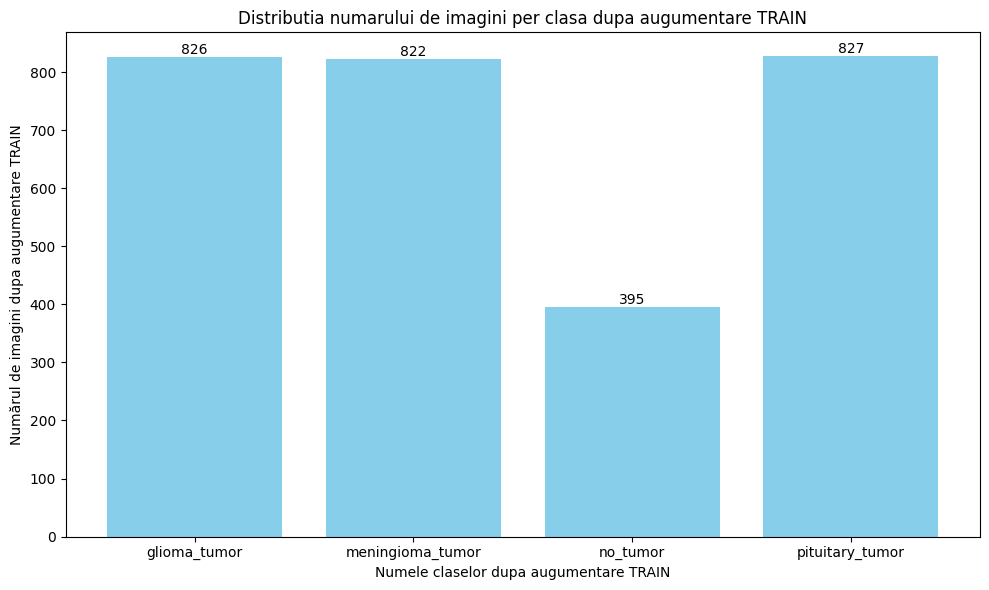

In [21]:
plt.figure(figsize=(10, 6))
plt.bar(class_names_train, num_each_train, color='skyblue')


plt.title('Distributia numarului de imagini per clasa dupa augumentare TRAIN') # afisarea imaginilor dupa aplicarea augumentarilor
plt.xlabel('Numele claselor dupa augumentare TRAIN')
plt.ylabel('Numărul de imagini dupa augumentare TRAIN')

for i, count in enumerate(num_each_train):
    plt.text(i, count + 0.5, str(count), ha='center', va='bottom')

plt.tight_layout()
plt.show()

**APLICAREA DE AUGUMENTARI PE CLASELE DEFICITARE PENTRU TEST**

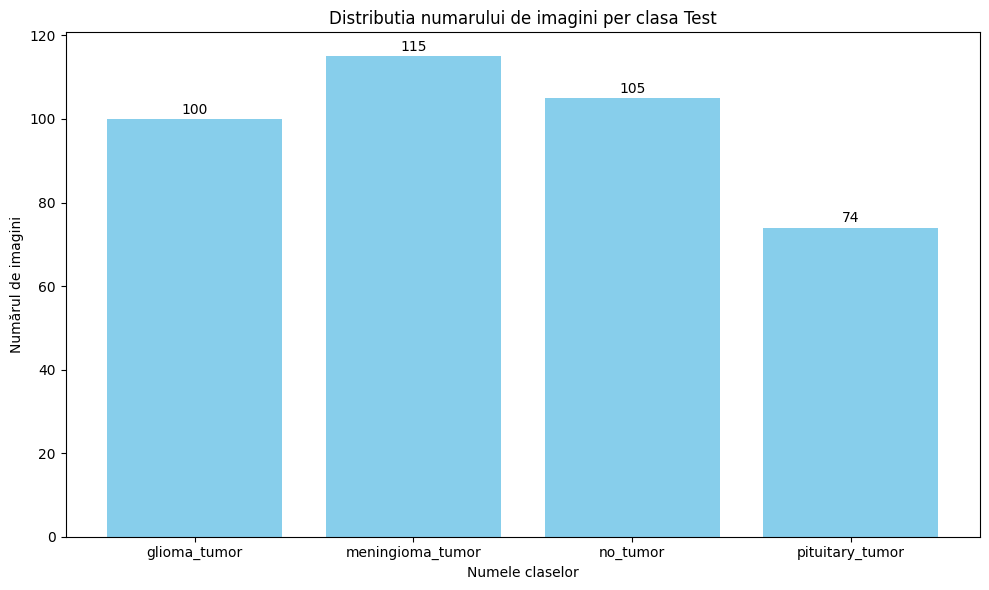

In [22]:
plt.figure(figsize=(10, 6))
plt.bar(class_names_test, num_each_test, color='skyblue') # afisare barplot pentru fiecare clasa din setul de antrenare pe baza la numarul de elemente din fiecare clasa

plt.title('Distributia numarului de imagini per clasa Test')
plt.xlabel('Numele claselor')
plt.ylabel('Numărul de imagini')

for i, count in enumerate(num_each_test):
    plt.text(i, count + 0.5, str(count), ha='center', va='bottom') # afisarea numarului de elemente din fiecare clasa deasupra barplotului clasei corespunzatoare

plt.tight_layout()
plt.show()

In [23]:
# deficit_number_pituitary_tumor = num_each_test[2] - num_each_test[3] # calcularea numarului de imagini lipsa pentru test
# pituitary_tumor_dir = os.path.join(data_dir_test, 'pituitary_tumor') # preluarea directorului ce contine imaginile lipsa pentru train, am ales aceasta clasa de imagini pe baza distributiei barplot de mai sus pentru test
# pituitary_tumor_images = [os.path.join(pituitary_tumor_dir, img) for img in os.listdir(pituitary_tumor_dir) if img.endswith(('jpg', 'jpeg', 'png'))] # preluarea imaginilor
# print(len(pituitary_tumor_images))

In [24]:
# for i in tqdm(range(deficit_number_pituitary_tumor), desc="Generating augmented images"):
#     img_path = pituitary_tumor_images[i % len(pituitary_tumor_images)] # preluarea cailor catre imagini
#     img = Image.open(img_path) # accesarea imaginii

#     augmented_img = augment_image(img) # aplicarea augumentarilor pe imaginea respectiva
#     augmented_img.save(os.path.join(pituitary_tumor_dir, f"augmented_pituitary_tumor_{i}.jpg")) # salvarea imaginii augumentate in acelasi director cu imaginile clasei, cu numar lipsa de elemente
#                                                                                                 # imaginile sub salvate cu "augumented" in fata


In [25]:
# num_images_after = len([img for img in os.listdir(pituitary_tumor_dir) if img.endswith(('jpg', 'jpeg', 'png'))]) # verificarea numarului de imagini dupa augumentare pentru clasa deficitara
# print(f"Numarul total de imagini în `pituitary_tumor` după augmentare: {num_images_after}")
# num_each_test = [len(os.listdir(os.path.join(data_dir_test, cls))) for cls in class_names_test]

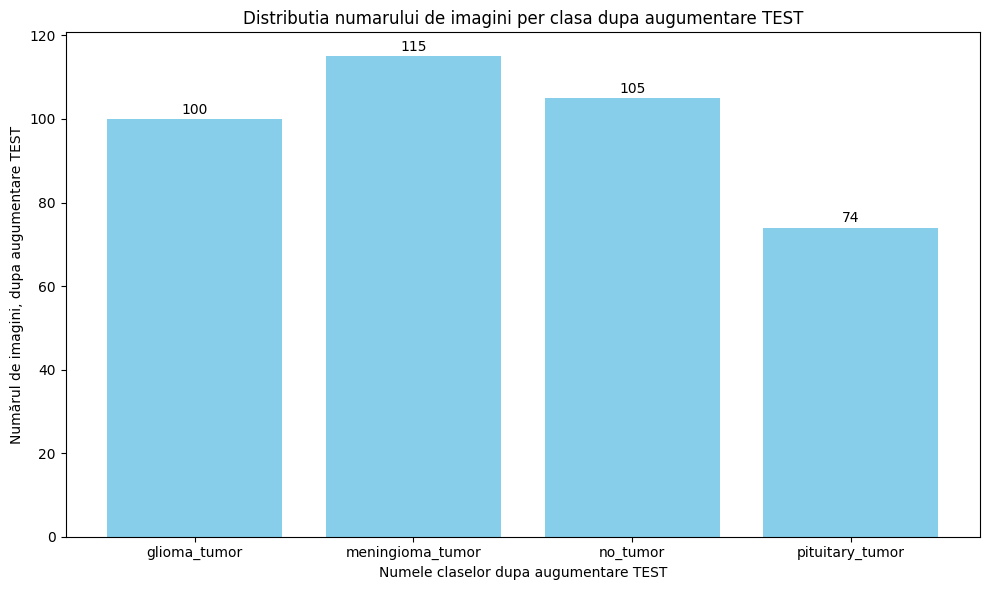

In [26]:
plt.figure(figsize=(10, 6))
plt.bar(class_names_test, num_each_test, color='skyblue')

plt.title('Distributia numarului de imagini per clasa dupa augumentare TEST')
plt.xlabel('Numele claselor dupa augumentare TEST')
plt.ylabel('Numărul de imagini, dupa augumentare TEST')

for i, count in enumerate(num_each_test):
    plt.text(i, count + 0.5, str(count), ha='center', va='bottom')

plt.tight_layout()
plt.show()

**APLICAREA DE AUGUMENTARI PE CLASELE DEFICITARE PENTRU VALIDATE**

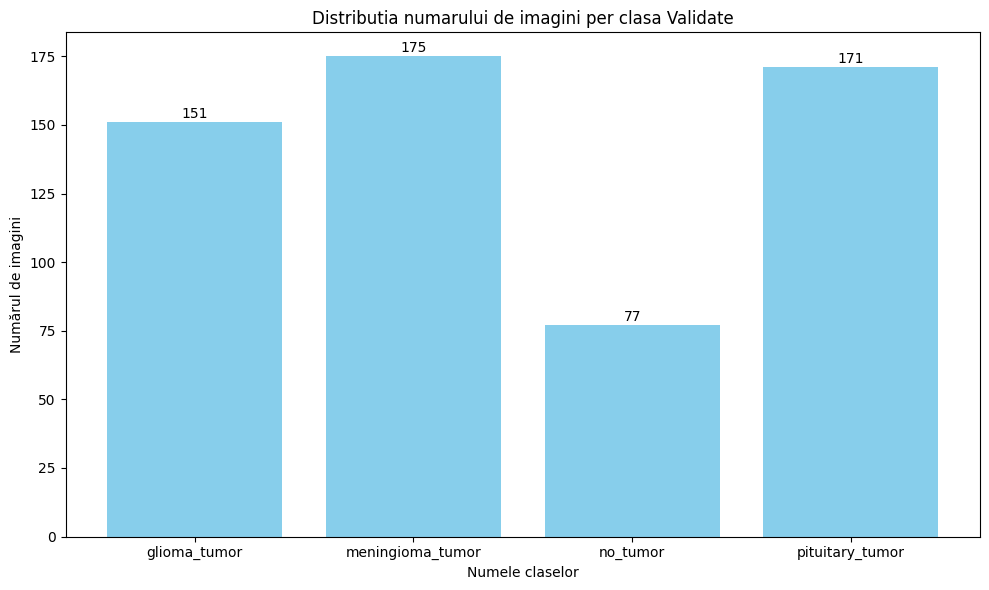

In [27]:
plt.figure(figsize=(10, 6))
plt.bar(class_names_val, num_each_val, color='skyblue')

plt.title('Distributia numarului de imagini per clasa Validate')
plt.xlabel('Numele claselor')
plt.ylabel('Numărul de imagini')

for i, count in enumerate(num_each_val):
    plt.text(i, count + 0.5, str(count), ha='center', va='bottom')

plt.tight_layout()
plt.show()

In [28]:
# num_each_val = [len(os.listdir(os.path.join(data_dir_val, cls))) for cls in class_names_val]
# print(num_each_val)

# deficit_number_no_tumor_val = num_each_val[3] - num_each_val[2] # calcularea numarului de imagini lipsa pentru val
# no_tumor_val_dir = os.path.join(data_dir_val, 'no_tumor') # preluarea directorului ce contine imaginile lipsa pentru train, am ales aceasta clasa de imagini pe baza distributiei barplot de mai sus pentru val
# no_tumor_images_val = [os.path.join(no_tumor_val_dir, img) for img in os.listdir(no_tumor_val_dir) if img.endswith(('jpg', 'jpeg', 'png'))] # preluarea imaginilor
# print(len(no_tumor_images_val))

In [29]:
# for i in tqdm(range(deficit_number_no_tumor_val), desc="Generating augmented images"):
#     img_path = no_tumor_images_val[i % len(no_tumor_images_val)] # preluarea cailor catre imagini
#     img = Image.open(img_path) # accesarea iamginii

#     augmented_img = augment_image(img) # aplicarea transformarilor pentru imagini
#     augmented_img.save(os.path.join(no_tumor_val_dir, f"no_tumor_val_dir{i}.jpg")) # salvarea imaginilor cu augumented in fata in acelasi director


In [30]:
# num_images_after = len([img for img in os.listdir(no_tumor_val_dir) if img.endswith(('jpg', 'jpeg', 'png'))]) # afisarea numarului de imagini dupa augumentari
# print(f"Numarul total de imagini în `no_tumor` după augmentare: {num_images_after}")
# num_each_val = [len(os.listdir(os.path.join(data_dir_val, cls))) for cls in class_names_val]

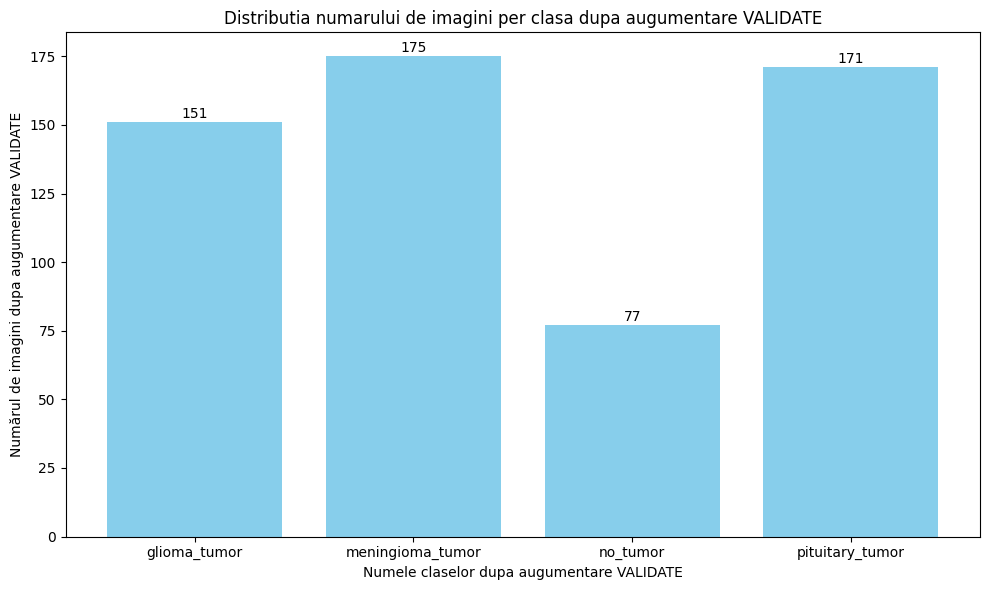

In [31]:
plt.figure(figsize=(10, 6))
plt.bar(class_names_val, num_each_val, color='skyblue')

plt.title('Distributia numarului de imagini per clasa dupa augumentare VALIDATE')
plt.xlabel('Numele claselor dupa augumentare VALIDATE')
plt.ylabel('Numărul de imagini dupa augumentare VALIDATE')

for i, count in enumerate(num_each_val):
    plt.text(i, count + 0.5, str(count), ha='center', va='bottom')

plt.tight_layout()
plt.show()

In [32]:
class_names_train = sorted(x for x in os.listdir(data_dir_train) if os.path.isdir(os.path.join(data_dir_train, x))) # dupa augumentare am actualizat variabilele pentru setul de train : class_names_train, num_class_train, image_files_train
                                                                                                                    # num_each_train, image_files_list_train, image_class_train cu scopul de a lucra mai departe cu clasele echilibrate
num_class_train = len(class_names_train)
image_files_train = [
    [os.path.join(data_dir_train, class_names_train[i], x) for x in os.listdir(os.path.join(data_dir_train, class_names_train[i]))]
    for i in range(num_class_train)
]
num_each_train = [len(image_files_train[i]) for i in range(num_class_train)]
image_files_list_train = []
image_class_train = []
for i in range(num_class_train):
    image_files_list_train.extend(image_files_train[i])
    image_class_train.extend([i] * num_each_train[i])
num_total_train = len(image_class_train)
image_width_train, image_height_train = PIL.Image.open(image_files_list_train[0]).size

print(f"Total image count: {num_total_train}")
print(f"Image dimensions: {image_width_train} x {image_height_train}")
print(f"Label names: {num_class_train}")
print(f"Label counts: {num_each_train}")

Total image count: 2870
Image dimensions: 512 x 512
Label names: 4
Label counts: [826, 822, 395, 827]


In [33]:
class_names_test = sorted(x for x in os.listdir(data_dir_test) if os.path.isdir(os.path.join(data_dir_test, x))) # dupa augumentare am actualizat variabilele pentru setul de test : class_names_test, num_class_test, image_files_test
                                                                                                                # num_each_test, image_files_list_test, image_class_test cu scopul de a lucra mai departe cu clasele echilibrate
num_class_test = len(class_names_test)
image_files_test = [
    [os.path.join(data_dir_test, class_names_test[i], x) for x in os.listdir(os.path.join(data_dir_test, class_names_test[i]))]
    for i in range(num_class_test)
]
num_each_test = [len(image_files_test[i]) for i in range(num_class_test)]
image_files_list_test = []
image_class_test = []
for i in range(num_class_test):
    image_files_list_test.extend(image_files_test[i])
    image_class_test.extend([i] * num_each_test[i])
num_total_test = len(image_class_test)
image_width_test, image_height_test = PIL.Image.open(image_files_list_test[0]).size

print(f"Total image count: {num_total_test}")
print(f"Image dimensions: {image_width_test} x {image_height_test}")
print(f"Label names: {class_names_test}")
print(f"Label counts: {num_each_test}")


Total image count: 394
Image dimensions: 495 x 619
Label names: ['glioma_tumor', 'meningioma_tumor', 'no_tumor', 'pituitary_tumor']
Label counts: [100, 115, 105, 74]


In [34]:
# am reefectuat impartirea setului de antrenare in 80% antrenare si 20% validare dupa operatiile de augumentare, cu scopul de a actualiza setul de validare

length = len(image_files_list_train)
indices = np.arange(length)
np.random.shuffle(indices)

train_split = int(0.8 * length) # impartirea setului de date in 80% antrenare si 20% validare
train_indices = indices[:train_split] # preluarea indicilor pentru setul de antrenare
val_indices = indices[train_split:] # preluarea indicilor pentru setul de validare

train_x = [image_files_list_train[i] for i in train_indices] # salvarea imaginilor conform split-ului in train_x
train_y = [image_class_train[i] for i in train_indices] # salvarea etichetelor conform split-ului in train_y

val_x = [image_files_list_train[i] for i in val_indices] # salvarea imaginilor conform split-ului in val_x
val_y = [image_class_train[i] for i in val_indices] # salvarea etichetelor conform split-ului in val_y


# setul de testare a ramas intact
test_x = image_files_list_test
test_y = image_class_test

print(f"Train set: {len(train_x)} imagini")
print(f"Validation set: {len(val_x)} imagini")
print(f"Test set: {len(test_x)} imagini")

class_names_val = class_names_train
num_class_val = len(class_names_val)

# actualizarea setului de validare in ceea ce priveste image_files_val, num_each_val, image_files_list_val, image_class_val.

image_files_val = [[] for _ in range(num_class_val)]
for img_path, label in zip(val_x, val_y):
    class_folder = os.path.join(data_dir_val, class_names_val[label])
    dest_path = os.path.join(class_folder, os.path.basename(img_path))
    shutil.copy(img_path, dest_path)
    image_files_val[label].append(dest_path)

num_each_val = [len(image_files_val[i]) for i in range(num_class_val)]
image_files_list_val = [img for sublist in image_files_val for img in sublist]
image_class_val = [i for i, count in enumerate(num_each_val) for _ in range(count)]
num_total_val = len(image_class_val)
image_width_val, image_height_val = Image.open(image_files_list_val[0]).size

print(f"Total image count in validation set: {num_total_val}")
print(f"Image dimensions: {image_width_val} x {image_height_val}")
print(f"Label names: {class_names_val}")
print(f"Label counts: {num_each_val}")

Train set: 2296 imagini
Validation set: 574 imagini
Test set: 394 imagini
Total image count in validation set: 574
Image dimensions: 512 x 512
Label names: ['glioma_tumor', 'meningioma_tumor', 'no_tumor', 'pituitary_tumor']
Label counts: [141, 173, 94, 166]


**CERINTA 4**

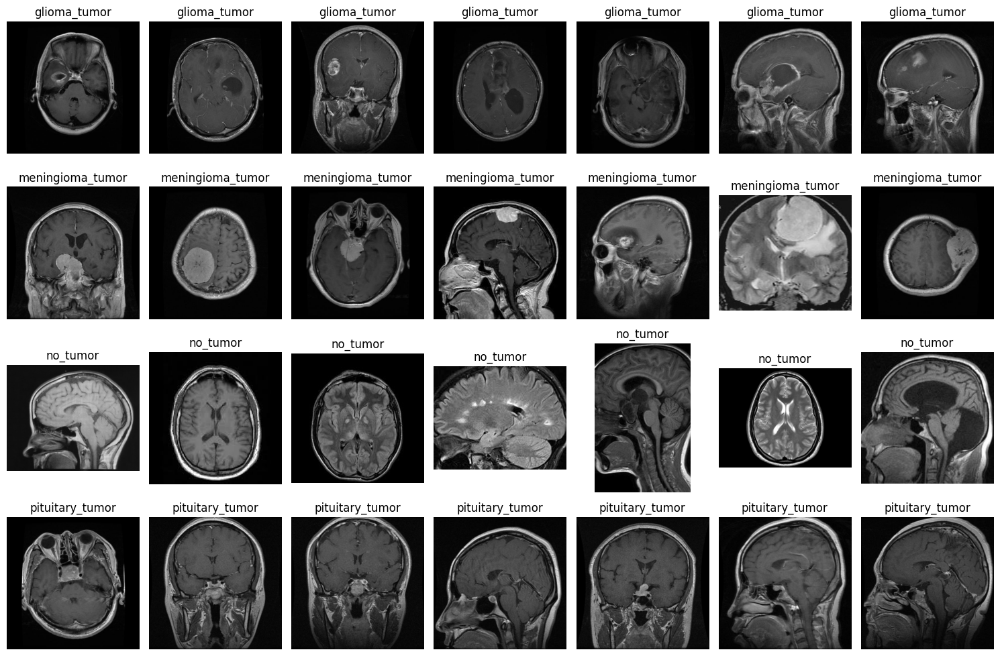

In [35]:
import random

num_images_per_class = 7 # numarul de imagini de afisat pentru fiecare clasa
plt.figure(figsize=(15, 10))

for i, class_name in enumerate(class_names_train):
    img_paths = image_files_train[i][:num_images_per_class] # pentru fiecare clasa iau primele num_images_per_class imagini, eu am ales primele 7
    for j, img_path in enumerate(img_paths):
        plt.subplot(num_class_train, num_images_per_class, i * num_images_per_class + j + 1) # afisare in subplot
        img = PIL.Image.open(img_path) # accesarea imaginii
        plt.imshow(img) # afisarea imaginii
        plt.title(class_name) # titlu pentru imagine, reprezentand clasa din care face parte
        plt.axis('off')

plt.tight_layout()
plt.show()

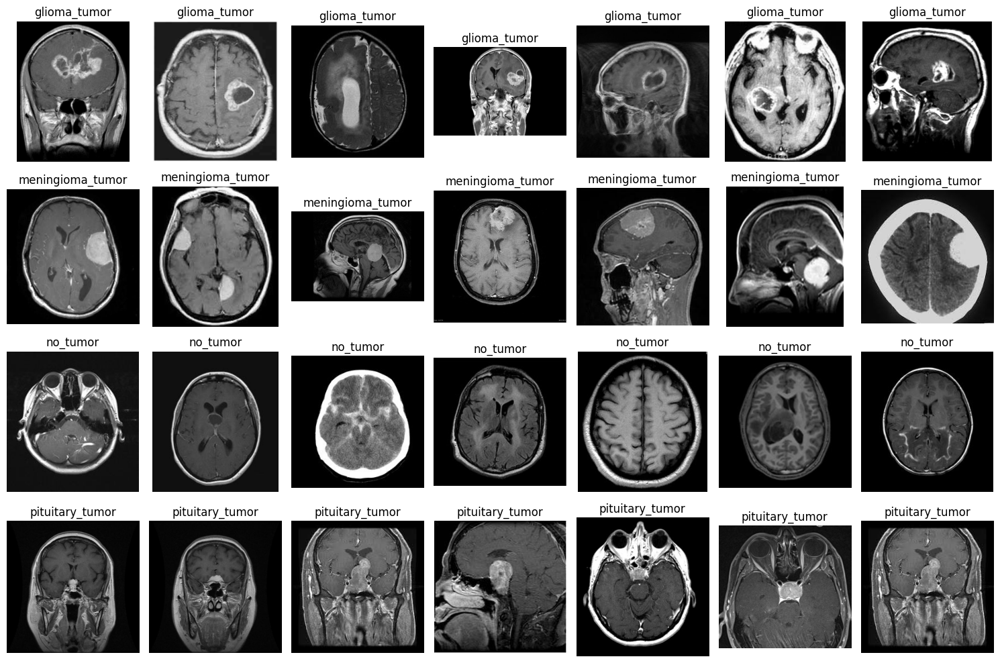

In [36]:
num_images_per_class = 7 # numarul de imagini de afisat pentru fiecare clasa
plt.figure(figsize=(15, 10))

for i, class_name in enumerate(class_names_test):
    img_paths = image_files_test[i][:num_images_per_class] # pentru fiecare clasa iau primele num_images_per_class imagini, eu am ales primele 7
    for j, img_path in enumerate(img_paths):
        plt.subplot(num_class_test, num_images_per_class, i * num_images_per_class + j + 1) # afisare in subplot
        img = PIL.Image.open(img_path) # accesarea imaginii
        plt.imshow(img) # afisarea imaginii
        plt.title(class_name) # titlu pentru imagine, reprezentand clasa din care face parte
        plt.axis('off')

plt.tight_layout()
plt.show()

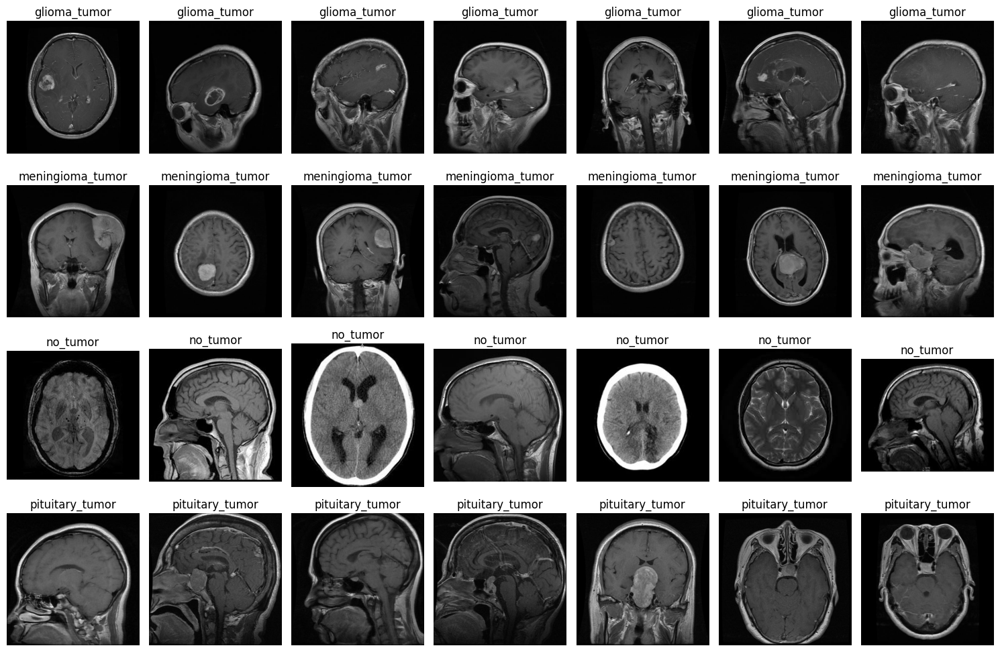

In [37]:
num_images_per_class = 7 # numarul de imagini de afisat pentru fiecare clasa
plt.figure(figsize=(15, 10))

for i, class_name in enumerate(class_names_val):
    img_paths = image_files_val[i][:num_images_per_class] # pentru fiecare clasa iau primele num_images_per_class imagini, eu am ales primele 7
    for j, img_path in enumerate(img_paths):
        plt.subplot(num_class_val, num_images_per_class, i * num_images_per_class + j + 1) # afisare in subplot
        img = PIL.Image.open(img_path) # accesarea imaginii
        plt.imshow(img) # afisarea imaginii
        plt.title(class_name) # titlu pentru imagine, reprezentand clasa din care face parte
        plt.axis('off')

plt.tight_layout()
plt.show()

**CERINTA 5**

TRAIN

In [38]:
target_size = (256, 256) # dimensiunea pe care ne-o dorim la toate imaginile
target_channels = 1 # numarul de canale pe care nu-l dorim la toate imaginile, in dorinta de a le face Grayscale

dimension_issues_train = [] # tinem evidenta de cate imagini nu au dimensiunea dorita
channel_issues_train = [] # tinem evidenta de cate imagini nu au numarul de canale dorit

for img_path in image_files_list_train:
    img = Image.open(img_path) # accesam imaginea

    img_array = np.array(img) # o convertim la array in scopul de a o converti la o matrice de valori numerice
    if img_array.ndim == 2: # daca are 2 dimensiuni adica inaltime si latime inseamna ca by default este alb-negru
        channels = 1 # deci numarul de canale este 1
    elif img_array.ndim == 3: # daca are 3 dimensiuni atunci inseamna ca are inaltime, latime si numar de canale
        channels = img_array.shape[2] # deci numarul de canale nu mai este 1
    else:
        print(f"Imaginea {img_path} are un format necunoscut.")
        continue # in caz de gasim imagini cu format nedeterminist atunci afisam un mesaj si iteram mai departe

    if channels != target_channels: # daca imaginea respectiva nu are numarul de canale dorit
        channel_issues_train.append(img_path) # adaugam la evidenta imaginilor cu numar de canale nedorit
        if target_channels == 1: # daca vrem un singur canal
            img = img.convert("L") # facem conversie grayscale https://www.geeksforgeeks.org/python-pil-image-convert-method/

    if img.size != target_size: # daca imaginea nu are dimensiunea dorita
        dimension_issues_train.append(img_path) # adaugam la evidenta imaginilor cu dimensiune nedorita
        img = img.resize(target_size) # redimensionam imaginea la dimensiunea dorita

    img.save(img_path) # salvam imaginea

# afisam statistici despre imaginile care nu indeplinesc conditiile dorite
print(f"numarul de imagini cu număr nedorit de canale pentru train: {len(channel_issues_train)}")
print(f"numarul de imagini cu dimensiuni neuniforme pentru train: {len(dimension_issues_train)}")

# verificarea valorilor pixelilor pentru overall consistenta immaginilor
# asiguram normalizarea într-un interval consistent, 0-1
image_data_train = []
for img_path in image_files_list_train:
    img = Image.open(img_path)
    img_array = np.array(img) / 255.0  # normalizam la intervalul [0, 1]
    image_data_train.append(img_array)
    img.save(img_path)

numarul de imagini cu număr nedorit de canale pentru train: 2870
numarul de imagini cu dimensiuni neuniforme pentru train: 2855


TEST

In [39]:
target_size = (256, 256) # dimensiunea pe care ne-o dorim la toate imaginile
target_channels = 1 # numarul de canale pe care nu-l dorim la toate imaginile, in dorinta de a le face Grayscale

dimension_issues_test = [] # tinem evidenta de cate imagini nu au dimensiunea dorita
channel_issues_test = [] # tinem evidenta de cate imagini nu au numarul de canale dorit

for img_path in image_files_list_test:
    img = Image.open(img_path) # accesam imaginea

    img_array = np.array(img) # o convertim la array in scopul de a o converti la o matrice de valori numerice
    if img_array.ndim == 2:  # daca are 2 dimensiuni adica inaltime si latime inseamna ca by default este alb-negru
        channels = 1 # deci numarul de canale este 1
    elif img_array.ndim == 3: # daca are 3 dimensiuni atunci inseamna ca are inaltime, latime si numar de canale
        channels = img_array.shape[2] # deci numarul de canale nu mai este 1
    else:
        print(f"Imaginea {img_path} are un format necunoscut.")
        continue # in caz de gasim imagini cu format nedeterminist atunci afisam un mesaj si iteram mai departe

    if channels != target_channels: # daca imaginea respectiva nu are numarul de canale dorit
        channel_issues_test.append(img_path) # adaugam la evidenta imaginilor cu numar de canale nedorit
        if target_channels == 1: # daca vrem un singur canal
            img = img.convert("L")  # facem conversie grayscale https://www.geeksforgeeks.org/python-pil-image-convert-method/

    if img.size != target_size: # daca imaginea nu are dimensiunea dorita
        dimension_issues_test.append(img_path) # adaugam la evidenta imaginilor cu dimensiune nedorita
        img = img.resize(target_size) # redimensionam imaginea la dimensiunea dorita

    img.save(img_path) # salvam imaginea

# afisam statistici despre imaginile care nu indeplinesc conditiile dorite
print(f"numarul de imagini cu număr nedorit de canale pentru test: {len(channel_issues_test)}")
print(f"numarul de imagini cu dimensiuni neuniforme pentru test: {len(dimension_issues_test)}")

# verificarea valorilor pixelilor pentru overall consistenta immaginilor
# asiguram normalizarea într-un interval consistent, 0-1
image_data_test = []
for img_path in image_files_list_test:
    img = Image.open(img_path)
    img_array = np.array(img) / 255.0  # normalizam la intervalul [0, 1]
    image_data_test.append(img_array)
    img.save(img_path)

numarul de imagini cu număr nedorit de canale pentru test: 394
numarul de imagini cu dimensiuni neuniforme pentru test: 391


VALIDATE

In [40]:
target_size = (256, 256) # dimensiunea pe care ne-o dorim la toate imaginile
target_channels = 1 # numarul de canale pe care nu-l dorim la toate imaginile, in dorinta de a le face Grayscale

dimension_issues_val = [] # tinem evidenta de cate imagini nu au dimensiunea dorita
channel_issues_val = [] # tinem evidenta de cate imagini nu au numarul de canale dorit

for img_path in image_files_list_val:
    img = Image.open(img_path) # accesam imaginea

    img_array = np.array(img) # o convertim la array in scopul de a o converti la o matrice de valori numerice
    if img_array.ndim == 2:  # daca are 2 dimensiuni adica inaltime si latime inseamna ca by default este alb-negru
        channels = 1 # deci numarul de canale este 1
    elif img_array.ndim == 3: # daca are 3 dimensiuni atunci inseamna ca are inaltime, latime si numar de canale
        channels = img_array.shape[2] # deci numarul de canale nu mai este 1
    else:
        print(f"Imaginea {img_path} are un format necunoscut.")
        continue # in caz de gasim imagini cu format nedeterminist atunci afisam un mesaj si iteram mai departe

    if channels != target_channels: # daca imaginea respectiva nu are numarul de canale dorit
        channel_issues_val.append(img_path) # adaugam la evidenta imaginilor cu numar de canale nedorit
        if target_channels == 1: # daca vrem un singur canal
            img = img.convert("L")  # facem conversie grayscale https://www.geeksforgeeks.org/python-pil-image-convert-method/

    if img.size != target_size: # daca imaginea nu are dimensiunea dorita
        dimension_issues_val.append(img_path) # adaugam la evidenta imaginilor cu dimensiune nedorita
        img = img.resize(target_size) # redimensionam imaginea la dimensiunea dorita

    img.save(img_path) # salvam imaginea

# afisam statistici despre imaginile care nu indeplinesc conditiile dorite
print(f"numarul de imagini cu număr nedorit de canale pentru validate: {len(channel_issues_val)}")
print(f"numarul de imagini cu dimensiuni neuniforme pentru validate: {len(dimension_issues_val)}")

# verificarea valorilor pixelilor pentru overall consistenta immaginilor
# asiguram normalizarea într-un interval consistent, 0-1
image_data_val = []
for img_path in image_files_list_val:
    img = Image.open(img_path)
    img_array = np.array(img) / 255.0  # normalizam la intervalul [0, 1]
    image_data_val.append(img_array)
    img.save(img_path)

numarul de imagini cu număr nedorit de canale pentru validate: 574
numarul de imagini cu dimensiuni neuniforme pentru validate: 570


PREZENTAREA A 4 IMAGINI DIN TRAIN SI TEST DUPA APLICAREA REDIMENSIONARII SI TRANSFORMARII IN GRAYSCALE PENTRU TRAIN

[20, 10, 30, 1]
Dimensiunea imaginii <PIL.JpegImagePlugin.JpegImageFile image mode=L size=256x256 at 0x79B46B1B2A70> este de : (256, 256), iar pixelii : pixel1 0 si pixel2 241
Dimensiunea imaginii <PIL.JpegImagePlugin.JpegImageFile image mode=L size=256x256 at 0x79B46AF83CD0> este de : (256, 256), iar pixelii : pixel1 0 si pixel2 251
Dimensiunea imaginii <PIL.JpegImagePlugin.JpegImageFile image mode=L size=256x256 at 0x79B46ADE0400> este de : (256, 256), iar pixelii : pixel1 0 si pixel2 255
Dimensiunea imaginii <PIL.JpegImagePlugin.JpegImageFile image mode=L size=256x256 at 0x79B46AE0D3F0> este de : (256, 256), iar pixelii : pixel1 0 si pixel2 246


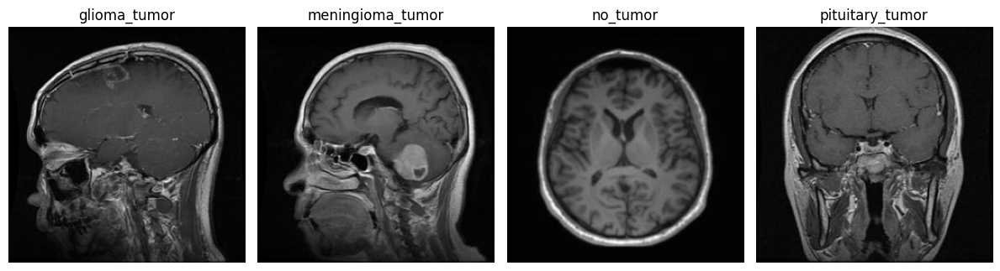

In [41]:
each = []
elem2 = 20
elem0 = 10
elem3 = 30
elem1 = 1
each.append(elem2) # adaug elementele pe care vreau sa le afisez
each.append(elem0)
each.append(elem3)
each.append(elem1)

print(each) # afisez elementele selectate

img_paths = []
for i in range(num_class_train):
    img_paths.append(image_files_train[i][each[i]]) # in functie de elementele selectate, iau caile catre acele elemente care sunt imagini

plt.figure(figsize=(12, 8))

for i, img_path in enumerate(img_paths):
    img = PIL.Image.open(img_path) # accesez imaginea
    dimension = img.size # ii iau dimensiunea
    img_Array = np.array(img)
    pixel1 = img_Array.min() # iau pixelii, cel mai mare si cel mai mic
    pixel2 = img_Array.max()
    print(f"Dimensiunea imaginii {img} este de : {dimension}, iar pixelii : pixel1 {pixel1} si pixel2 {pixel2}") # afisez informatiile extrase
    plt.subplot(1, num_class_train, i + 1)
    plt.imshow(img, cmap='gray') # afisez imaginea, motivul pentru care utilizez cmap='gray' este ca pyplot.imshow, pentru afisare foloseste by default o colorare implicita in nuante de verde, albastru si galben (viridis)
                                 # dovada ca este Grayscale sta in afisare, PIL.JpegImagePlugin.JpegImageFile image mode=L, observam ca modul imaginii este L ceea ce inseamna ca este Grayscale
                                 # https://pillow.readthedocs.io/en/stable/reference/Image.html
    plt.title(class_names_train[i])
    plt.axis('off')

plt.tight_layout()
plt.show()


PREZENTAREA A 4 IMAGINI DIN TRAIN SI TEST DUPA APLICAREA REDIMENSIONARII SI TRANSFORMARII IN GRAYSCALE PENTRU TEST

[20, 10, 30, 1]
Dimensiunea imaginii <PIL.JpegImagePlugin.JpegImageFile image mode=L size=256x256 at 0x79B46B147B20> este de : (256, 256), iar pixelii : pixel1 0 si pixel2 205
Dimensiunea imaginii <PIL.JpegImagePlugin.JpegImageFile image mode=L size=256x256 at 0x79B46ACE5510> este de : (256, 256), iar pixelii : pixel1 0 si pixel2 255
Dimensiunea imaginii <PIL.JpegImagePlugin.JpegImageFile image mode=L size=256x256 at 0x79B46AD16680> este de : (256, 256), iar pixelii : pixel1 26 si pixel2 201
Dimensiunea imaginii <PIL.JpegImagePlugin.JpegImageFile image mode=L size=256x256 at 0x79B46AD4EE30> este de : (256, 256), iar pixelii : pixel1 0 si pixel2 244


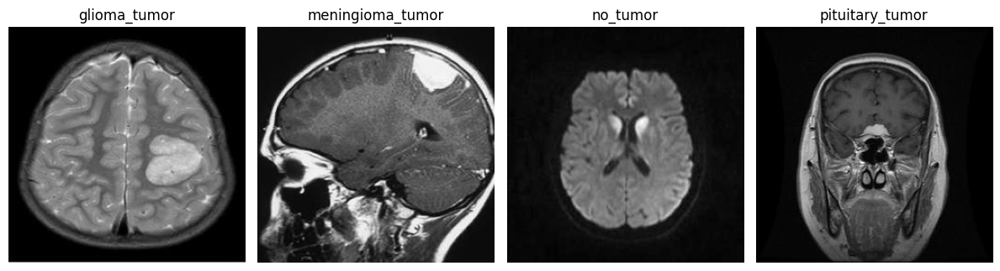

In [42]:
each = []
elem2 = 20
elem0 = 10
elem3 = 30
elem1 = 1
each.append(elem2) # adaug elementele pe care vreau sa le afisez
each.append(elem0)
each.append(elem3)
each.append(elem1)

print(each) # afisez elementele selectate

img_paths = []
for i in range(num_class_test):
    img_paths.append(image_files_test[i][each[i]]) # in functie de elementele selectate, iau caile catre acele elemente care sunt imagini

plt.figure(figsize=(12, 8))

for i, img_path in enumerate(img_paths):
    img = PIL.Image.open(img_path) # accesez imaginea
    dimension = img.size # ii iau dimensiunea
    img_Array = np.array(img)
    pixel1 = img_Array.min() # iau pixelii, cel mai mare si cel mai mic
    pixel2 = img_Array.max()
    print(f"Dimensiunea imaginii {img} este de : {dimension}, iar pixelii : pixel1 {pixel1} si pixel2 {pixel2}") # afisez informatiile extrase
    plt.subplot(1, num_class_test, i + 1)
    plt.imshow(img, cmap='gray') # afisez imaginea, motivul pentru care utilizez cmap='gray' este ca pyplot.imshow, pentru afisare foloseste by default o colorare implicita in nuante de verde, albastru si galben (viridis)
                                 # dovada ca este Grayscale sta in afisare, PIL.JpegImagePlugin.JpegImageFile image mode=L, observam ca modul imaginii este L ceea ce inseamna ca este Grayscale
                                 # https://pillow.readthedocs.io/en/stable/reference/Image.html
    plt.title(class_names_test[i])
    plt.axis('off')

plt.tight_layout()
plt.show()


PREZENTAREA A 4 IMAGINI DIN TRAIN SI TEST DUPA APLICAREA REDIMENSIONARII SI TRANSFORMARII IN GRAYSCALE PENTRU VALIDATE

[20, 10, 30, 1]
Dimensiunea imaginii <PIL.JpegImagePlugin.JpegImageFile image mode=L size=256x256 at 0x79B46AE4A470> este de : (256, 256), iar pixelii : pixel1 0 si pixel2 243
Dimensiunea imaginii <PIL.JpegImagePlugin.JpegImageFile image mode=L size=256x256 at 0x79B46AC1EDD0> este de : (256, 256), iar pixelii : pixel1 0 si pixel2 232
Dimensiunea imaginii <PIL.JpegImagePlugin.JpegImageFile image mode=L size=256x256 at 0x79B46AC4FCA0> este de : (256, 256), iar pixelii : pixel1 0 si pixel2 255
Dimensiunea imaginii <PIL.JpegImagePlugin.JpegImageFile image mode=L size=256x256 at 0x79B46921CCD0> este de : (256, 256), iar pixelii : pixel1 0 si pixel2 253


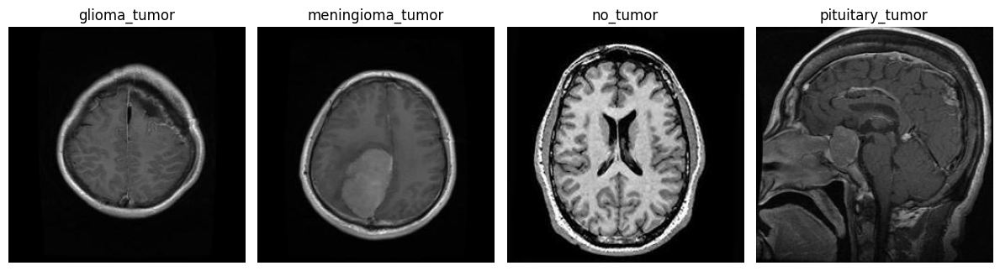

In [43]:
each = []
elem2 = 20
elem0 = 10
elem3 = 30
elem1 = 1
each.append(elem2) # adaug elementele pe care vreau sa le afisez
each.append(elem0)
each.append(elem3)
each.append(elem1)

print(each) # afisez elementele selectate

img_paths = []
for i in range(num_class_val):
    img_paths.append(image_files_val[i][each[i]]) # in functie de elementele selectate, iau caile catre acele elemente care sunt imagini
plt.figure(figsize=(12, 8))

for i, img_path in enumerate(img_paths):
    img = PIL.Image.open(img_path) # accesez imaginea
    dimension = img.size # ii iau dimensiunea
    img_Array = np.array(img)
    pixel1 = img_Array.min() # iau pixelii, cel mai mare si cel mai mic
    pixel2 = img_Array.max()
    print(f"Dimensiunea imaginii {img} este de : {dimension}, iar pixelii : pixel1 {pixel1} si pixel2 {pixel2}")  # afisez informatiile extrase
    plt.subplot(1, num_class_val, i + 1)
    plt.imshow(img, cmap='gray') # afisez imaginea, motivul pentru care utilizez cmap='gray' este ca pyplot.imshow, pentru afisare foloseste by default o colorare implicita in nuante de verde, albastru si galben (viridis)
                                 # dovada ca este Grayscale sta in afisare, PIL.JpegImagePlugin.JpegImageFile image mode=L, observam ca modul imaginii este L ceea ce inseamna ca este Grayscale
                                 # https://pillow.readthedocs.io/en/stable/reference/Image.html
    plt.title(class_names_val[i])
    plt.axis('off')

plt.tight_layout()
plt.show()


**CERINTA 6**

**DEFINIREA TRANSFORAMRILOR**

In [44]:
def show_all_transformations(processed_steps): # afisez toate transformarile : CLAHE, GAUSSIAN FILTER, SOBEL EDGE DETECTION
    fig, axes = plt.subplots(1, len(processed_steps), figsize=(15, 5))
    for i, (title, img) in enumerate(processed_steps):
        img = img.squeeze() # elimin canalul daca exista pentru afisare
        axes[i].imshow(img, cmap='gray')
        axes[i].set_title(f"{title}")
        axes[i].axis('off')
    plt.tight_layout()
    plt.show()

In [45]:
def custom_image_processing(img, return_steps):
    steps = []
    if isinstance(img, Image.Image):
        img = np.array(img) # daca nu este tensor convertim oricum la numpyarray pentru usurinta in aplicarea transforamrilor
    elif isinstance(img, torch.Tensor):
        img = img.numpy()  # convertim la numpy de la tensor pentru a fi mai usor de utilizat in aplicarea transformarilor
    elif not isinstance(img, np.ndarray):
        raise TypeError("Input image must be a numpy array, PIL image, or torch tensor")

    # convertim la uint8 dacă imaginea nu este deja în acest format pentru ca sa putem utiliza CLAHE pentru contrast
    if img.dtype != np.uint8:
        img = (img * 255).astype(np.uint8)

    # Convertim în grayscale dacă imaginea este color
    if img.ndim == 3 and img.shape[2] == 3:  # Dacă imaginea este RGB
        img = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)

    # aplicam GaussianBlur pentru a netezi imaginea
    img = cv2.GaussianBlur(img, (5, 5), sigmaX=1.0)
    steps.append(("GAUSSIAN APPLIED", img))


    # aplicam CLAHE pentru imbunatatirea contrastului
    clahe = cv2.createCLAHE(clipLimit=2.0, tileGridSize=(8, 8))
    img_clahe = clahe.apply(img)
    steps.append(("CLAHE APPLIED", img_clahe))


    # aplicam filtrul Sobel pentru detectarea marginilor
    sobelx = cv2.Sobel(img_clahe, cv2.CV_64F, 1, 0, ksize=3)
    steps.append(("SOBEL X APPLIED", sobelx))
    sobely = cv2.Sobel(img_clahe, cv2.CV_64F, 0, 1, ksize=3)
    steps.append(("SOBEL Y APPLIED", sobely))

    # calculam magnitudinea marginilor
    edges = cv2.magnitude(sobelx, sobely)
    # normalizam intre 0 si 255
    edges = cv2.normalize(edges, None, 0, 255, cv2.NORM_MINMAX)
    edges = np.uint8(edges)
    steps.append(("Edges APPLIED", edges))

    # pastram doar marginile relevante
    _, rib_mask = cv2.threshold(edges, 15, 255, cv2.THRESH_BINARY)
    rib_mask = np.expand_dims(rib_mask, axis=0)
    steps.append(("FINAL", rib_mask))

    if return_steps:
        return steps # pentru vizualizarea transformarilor
    else:
        return rib_mask  # returnez imaginea finala pentru antrenare

In [46]:
# convertesc la PIL pentru antrenare, se observa ca verific canalele cu ndim pentru ca in urma unor transformari din Pipeline, imi era modificat numarul de canale cum a fost in cazul EnsureChannelFirst
def convert_to_pil(img):
    if isinstance(img, MetaTensor):
        img = img.numpy()
    if img.ndim == 3 and img.shape[0] == 1:
        img = img.squeeze(0)
    img = (img * 255).astype(np.uint8) if img.dtype != np.uint8 else img  # convertesc la uint8 pentru siguranta aplicarii transformarilor de mai sus
    return Image.fromarray(img)


**CERINTA 2.3**

SETUL 1 DE TRANSFORMARI

In [47]:
# train_transforms = Compose(
#     [
#         LoadImage(image_only=True), # incarc imaginea dar pastrez doar datele de imagine
#         Lambda(func=convert_to_pil), # aplic functia de convertire la PIL pentru fiecare imagine
#         Lambda(func=lambda x: Image.fromarray(x.numpy()) if isinstance(x, MetaTensor) else x), # convertire de la MetaTensor la Tensor pentru fiecare imagine
#         Lambda(func=lambda x: custom_image_processing(x, False)), # aplic transformarile de CLAHE, Sobel descrise in functia custom_image_processing
#         RandZoom(min_zoom=0.9, max_zoom=1.1, prob=0.5), # aplic o augumentare de Zoom de porbabilitate 50% intre  o  micsorare usoara de 0.9 si o marire usoara de 1.1
#         Resize(spatial_size=(128, 128)), # dau resize la imagine
#     ]
# )

# val_transforms = Compose(
#     [
#         LoadImage(image_only=True), # incarc imaginea dar pastrez doar datele de imagine
#         Lambda(func=convert_to_pil), # aplic functia de convertire la PIL pentru fiecare imagine
#         Lambda(func=lambda x: Image.fromarray(x.numpy()) if isinstance(x, MetaTensor) else x), # convertire de la MetaTensor la Tensor pentru fiecare imagine
#         Lambda(func=lambda x: custom_image_processing(x, False)), # aplic transformarile de CLAHE, Sobel descrise in functia custom_image_processing
#         RandZoom(min_zoom=0.9, max_zoom=1.1, prob=0.5), # aplic o augumentare de Zoom de porbabilitate 50% intre  o  micsorare usoara de 0.9 si o marire usoara de 1.1
#         Resize(spatial_size=(128, 128)), # dau resize la imagine
#     ]
# )


# y_pred_trans = Compose([Activations(softmax=True)]) # aplic functia de activare Softmax
# y_trans = Compose([AsDiscrete(to_onehot=num_class_train)]) # folosesc one hot encoder pentru encoding

SETUL 2 DE TRANSFORMARI

In [48]:
# train_transforms = Compose(
#     [
#         LoadImage(image_only=True), # incarc imaginea dar pastrez doar datele de imagine
#         Lambda(func=convert_to_pil), # aplic functia de convertire la PIL pentru fiecare imagine
#         Lambda(func=lambda x: Image.fromarray(x.numpy()) if isinstance(x, MetaTensor) else x), # convertire de la MetaTensor la Tensor pentru fiecare imagine
#         Lambda(func=lambda x: custom_image_processing(x, False)), # aplic transformarile de CLAHE, Sobel descrise in functia custom_image_processing
#         RandZoom(min_zoom=0.9, max_zoom=1.1, prob=0.5), # aplic o augumentare de Zoom de porbabilitate 50% intre  o  micsorare usoara de 0.9 si o marire usoara de 1.1
#     ]
# )

# val_transforms = Compose(
#     [
#         LoadImage(image_only=True), # incarc imaginea dar pastrez doar datele de imagine
#         Lambda(func=convert_to_pil), # aplic functia de convertire la PIL pentru fiecare imagine
#         Lambda(func=lambda x: Image.fromarray(x.numpy()) if isinstance(x, MetaTensor) else x), # convertire de la MetaTensor la Tensor pentru fiecare imagine
#         Lambda(func=lambda x: custom_image_processing(x, False)), # aplic transformarile de CLAHE, Sobel descrise in functia custom_image_processing
#         RandZoom(min_zoom=0.9, max_zoom=1.1, prob=0.5), # aplic o augumentare de Zoom de porbabilitate 50% intre  o  micsorare usoara de 0.9 si o marire usoara de 1.1
#     ]
# )


# y_pred_trans = Compose([Activations(softmax=True)]) # aplic functia de activare Softmax
# y_trans = Compose([AsDiscrete(to_onehot=num_class_train)]) # folosesc one hot encoder pentru encoding

SETUL 3 DE TRANSFORMARI

In [49]:
# train_transforms = Compose(
#     [
#         LoadImage(image_only=True), # incarc imaginea dar pastrez doar datele de imagine
#         Lambda(func=convert_to_pil), # aplic functia de convertire la PIL pentru fiecare imagine
#         Lambda(func=lambda x: Image.fromarray(x.numpy()) if isinstance(x, MetaTensor) else x), # convertire de la MetaTensor la Tensor pentru fiecare imagine
#         Lambda(func=lambda x: custom_image_processing(x, False)), # aplic transformarile de CLAHE, Sobel descrise in functia custom_image_processing
#         Lambda(func=lambda x: x.float()) # convertesc imaginile la tensor de tip float32
#     ]
# )

# val_transforms = Compose(
#     [
#         LoadImage(image_only=True), # incarc imaginea dar pastrez doar datele de imagine
#         Lambda(func=convert_to_pil), # aplic functia de convertire la PIL pentru fiecare imagine
#         Lambda(func=lambda x: Image.fromarray(x.numpy()) if isinstance(x, MetaTensor) else x), # convertire de la MetaTensor la Tensor pentru fiecare imagine
#         Lambda(func=lambda x: custom_image_processing(x, False)), # aplic transformarile de CLAHE, Sobel descrise in functia custom_image_processing
#         Lambda(func=lambda x: x.float()) # convertesc imaginile la tensor de tip float32
#     ]
# )


# y_pred_trans = Compose([Activations(softmax=True)]) # aplic functia de activare Softmax
# y_trans = Compose([AsDiscrete(to_onehot=num_class_train)]) # folosesc one hot encoder pentru encoding

SETUL 4 DE TRANSFORMARI

In [50]:
train_transforms = Compose(
    [
        LoadImage(image_only=True), # incarc imaginea dar pastrez doar datele de imagine
        Lambda(func=convert_to_pil), # aplic functia de convertire la PIL pentru fiecare imagine
        Lambda(func=lambda x: Image.fromarray(x.numpy()) if isinstance(x, MetaTensor) else x), # convertire de la MetaTensor la Tensor pentru fiecare imagine
        ToTensor(), # convertesc imaginile la tensor
        RandZoom(min_zoom=0.9, max_zoom=1.1, prob=0.5), # aplic o augumentare de Zoom de porbabilitate 50% intre  o  micsorare usoara de 0.9 si o marire usoara de 1.1
        Resize(spatial_size=(128, 128)) # dau resize la imagine
    ]
)

val_transforms = Compose(
    [
        LoadImage(image_only=True), # incarc imaginea dar pastrez doar datele de imagine
        Lambda(func=convert_to_pil), # aplic functia de convertire la PIL pentru fiecare imagine
        Lambda(func=lambda x: Image.fromarray(x.numpy()) if isinstance(x, MetaTensor) else x), # convertire de la MetaTensor la Tensor pentru fiecare imagine
        ToTensor(), # convertesc imaginile la tensor
        RandZoom(min_zoom=0.9, max_zoom=1.1, prob=0.5), # aplic o augumentare de Zoom de porbabilitate 50% intre  o  micsorare usoara de 0.9 si o marire usoara de 1.1
        Resize(spatial_size=(128, 128)) # dau resize la imagine
    ]
)


y_pred_trans = Compose([Activations(softmax=True)]) # aplic functia de activare Softmax
y_trans = Compose([AsDiscrete(to_onehot=num_class_train)]) # folosesc one hot encoder pentru encoding

SETUL 5 DE TRANSFORMARI

In [51]:
# train_transforms = Compose(
#     [
#         LoadImage(image_only=True), # incarc imaginea dar pastrez doar datele de imagine
#         Lambda(func=convert_to_pil), # aplic functia de convertire la PIL pentru fiecare imagine
#         Lambda(func=lambda x: Image.fromarray(x.numpy()) if isinstance(x, MetaTensor) else x), # convertire de la MetaTensor la Tensor pentru fiecare imagine
#         ToTensor(), # convertesc imaginile la tensor
#         Resize(spatial_size=(128, 128)), # dau resize la imagine
#     ]
# )

# val_transforms = Compose(
#     [
#         LoadImage(image_only=True), # incarc imaginea dar pastrez doar datele de imagine
#         Lambda(func=convert_to_pil), # aplic functia de convertire la PIL pentru fiecare imagine
#         Lambda(func=lambda x: Image.fromarray(x.numpy()) if isinstance(x, MetaTensor) else x), # convertire de la MetaTensor la Tensor pentru fiecare imagine
#         ToTensor(), # convertesc imaginile la tensor
#         Resize(spatial_size=(128, 128)), # dau resize la imagine
#     ]
# )


# y_pred_trans = Compose([Activations(softmax=True)]) # aplic functia de activare Softmax
# y_trans = Compose([AsDiscrete(to_onehot=num_class_train)]) # folosesc one hot encoder pentru encoding

**PENTRU CERINTA 2.2 MINIMUL DE CONFIGURATII CA SA POATA SA MEARGA TESTAREA, AUGUMENTARI PRECUM FILTRE GAUSSIAN SAU SOBEL SAU CLAHE SAU ROTIRE DE IMAGINE SAU RESIZE DE IMAGINE SAU ZOOM PE IMAGINE NU SUNT APLICATE, SUNT DOAR NISTE CONFIGURATII CA SA POATE FI APLICATA ANTRENAREA**

In [52]:
# train_transforms = Compose([
#     LoadImage(image_only=True), # incarca imaginea
#     EnsureChannelFirst(), # pune numarul de canale in fata
#     EnsureType(), # se asigura ca imaginile nu sunt MetaTensori ci doar Tensori
# ])

# val_transforms = Compose([
#     LoadImage(image_only=True), # incarca imaginea
#     EnsureChannelFirst(), # pune numarul de canale in fata
#     EnsureType(), # se asigura ca imaginile nu sunt MetaTensori ci doar Tensori
# ])

# y_pred_trans = Compose([Activations(softmax=True)]) # aplic functia de activare Softmax
# y_trans = Compose([AsDiscrete(to_onehot=num_class_train)]) # folosesc one hot encoder pentru encoding

INAINTE DE TRANSFORMARI TRAIN

[20, 10, 30, 1]
Dimensiunea imaginii <PIL.JpegImagePlugin.JpegImageFile image mode=L size=256x256 at 0x79B4692A3340> este de : (256, 256), iar pixelii : pixel1 0 si pixel2 241
Dimensiunea imaginii <PIL.JpegImagePlugin.JpegImageFile image mode=L size=256x256 at 0x79B469305C00> este de : (256, 256), iar pixelii : pixel1 0 si pixel2 251
Dimensiunea imaginii <PIL.JpegImagePlugin.JpegImageFile image mode=L size=256x256 at 0x79B4692A3340> este de : (256, 256), iar pixelii : pixel1 0 si pixel2 255
Dimensiunea imaginii <PIL.JpegImagePlugin.JpegImageFile image mode=L size=256x256 at 0x79B46916B370> este de : (256, 256), iar pixelii : pixel1 0 si pixel2 246


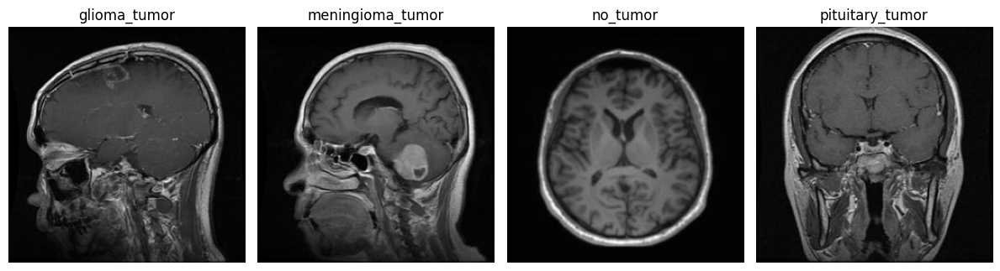

In [53]:
each = []
elem2 = 20
elem0 = 10
elem3 = 30
elem1 = 1
each.append(elem2) # adaug elementele pe care vreau sa le afisez
each.append(elem0)
each.append(elem3)
each.append(elem1)

print(each)

img_paths = []
for i in range(num_class_train):
    img_paths.append(image_files_train[i][each[i]])

plt.figure(figsize=(12, 8))

for i, img_path in enumerate(img_paths):
    img = PIL.Image.open(img_path)
    dimension = img.size
    img_Array = np.array(img)
    pixel1 = img_Array.min()
    pixel2 = img_Array.max()
    print(f"Dimensiunea imaginii {img} este de : {dimension}, iar pixelii : pixel1 {pixel1} si pixel2 {pixel2}")
    plt.subplot(1, num_class_train, i + 1)
    plt.imshow(img, cmap='gray')
    plt.title(class_names_train[i])
    plt.axis('off')

plt.tight_layout()
plt.show()


INAINTE DE TRANSFORMARI TEST

[20, 10, 30, 1]
Dimensiunea imaginii <PIL.JpegImagePlugin.JpegImageFile image mode=L size=256x256 at 0x79B4691F3C40> este de : (256, 256), iar pixelii : pixel1 0 si pixel2 205
Dimensiunea imaginii <PIL.JpegImagePlugin.JpegImageFile image mode=L size=256x256 at 0x79B46903B790> este de : (256, 256), iar pixelii : pixel1 0 si pixel2 255
Dimensiunea imaginii <PIL.JpegImagePlugin.JpegImageFile image mode=L size=256x256 at 0x79B46909C6A0> este de : (256, 256), iar pixelii : pixel1 26 si pixel2 201
Dimensiunea imaginii <PIL.JpegImagePlugin.JpegImageFile image mode=L size=256x256 at 0x79B4690CD720> este de : (256, 256), iar pixelii : pixel1 0 si pixel2 244


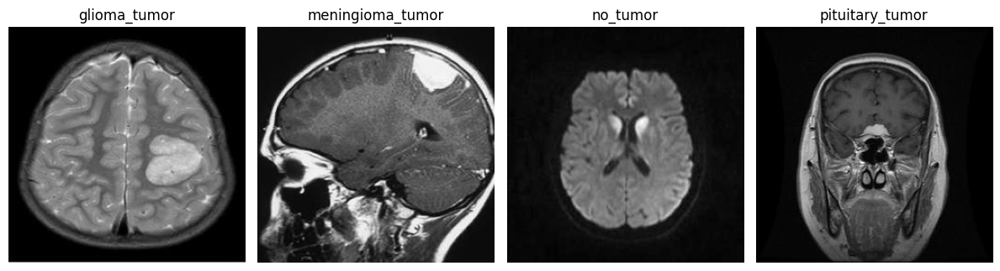

In [54]:
each = []
elem2 = 20
elem0 = 10
elem3 = 30
elem1 = 1
each.append(elem2) # adaug elementele pe care vreau sa le afisez
each.append(elem0)
each.append(elem3)
each.append(elem1)

print(each)

img_paths = []
for i in range(num_class_test):
    img_paths.append(image_files_test[i][each[i]])

plt.figure(figsize=(12, 8))

for i, img_path in enumerate(img_paths):
    img = PIL.Image.open(img_path)
    dimension = img.size
    img_Array = np.array(img)
    pixel1 = img_Array.min()
    pixel2 = img_Array.max()
    print(f"Dimensiunea imaginii {img} este de : {dimension}, iar pixelii : pixel1 {pixel1} si pixel2 {pixel2}")
    plt.subplot(1, num_class_test, i + 1)
    plt.imshow(img, cmap='gray')
    plt.title(class_names_test[i])
    plt.axis('off')

plt.tight_layout()
plt.show()


INAINTE DE TRANSFORMARI VALIDATE

[20, 10, 30, 1]
Dimensiunea imaginii <PIL.JpegImagePlugin.JpegImageFile image mode=L size=256x256 at 0x79B468F5BDF0> este de : (256, 256), iar pixelii : pixel1 0 si pixel2 243
Dimensiunea imaginii <PIL.JpegImagePlugin.JpegImageFile image mode=L size=256x256 at 0x79B468FA9CC0> este de : (256, 256), iar pixelii : pixel1 0 si pixel2 232
Dimensiunea imaginii <PIL.JpegImagePlugin.JpegImageFile image mode=L size=256x256 at 0x79B468FD60E0> este de : (256, 256), iar pixelii : pixel1 0 si pixel2 255
Dimensiunea imaginii <PIL.JpegImagePlugin.JpegImageFile image mode=L size=256x256 at 0x79B468E0F0D0> este de : (256, 256), iar pixelii : pixel1 0 si pixel2 253


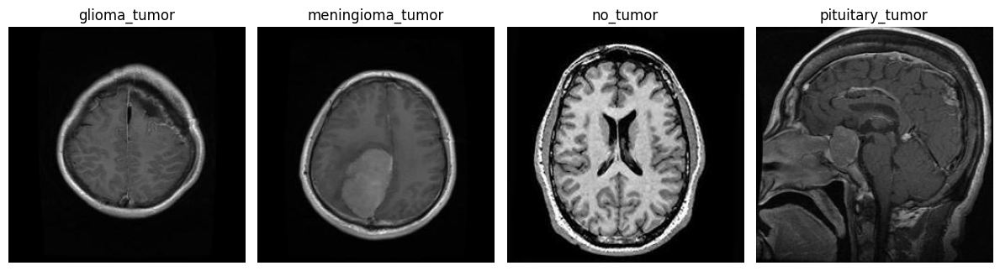

In [55]:
each = []
elem2 = 20
elem0 = 10
elem3 = 30
elem1 = 1
each.append(elem2) # adaug elementele pe care vreau sa le afisez
each.append(elem0)
each.append(elem3)
each.append(elem1)

print(each)

img_paths = []
for i in range(num_class_val):
    #img_paths.append(image_files_train[i][each[i]])
    img_paths.append(image_files_val[i][each[i]])
plt.figure(figsize=(12, 8))

for i, img_path in enumerate(img_paths):
    img = PIL.Image.open(img_path)
    dimension = img.size
    img_Array = np.array(img)
    pixel1 = img_Array.min()
    pixel2 = img_Array.max()
    print(f"Dimensiunea imaginii {img} este de : {dimension}, iar pixelii : pixel1 {pixel1} si pixel2 {pixel2}")
    plt.subplot(1, num_class_val, i + 1)
    plt.imshow(img, cmap='gray')
    plt.title(class_names_val[i])
    plt.axis('off')

plt.tight_layout()
plt.show()


**PENTRU CERINTA 2.5 AM SCHIMBAT batch_size de la 32 la 64**

In [160]:
train_ds = BrainTumorDataset(train_x, train_y, train_transforms) # un set de date personalizat pentru antrenarea modelului, folosind transformarile de mai sus
# train_loader = DataLoader(train_ds, batch_size=32, shuffle=True, num_workers=10) # DataLoader preia train_ds si il imparte in minibatch-uri
train_loader = DataLoader(train_ds, batch_size=64, shuffle=True, num_workers=10) # DataLoader preia train_ds si il imparte in minibatch-uri

val_ds = BrainTumorDataset(val_x, val_y, val_transforms) # un set de date personalizat pentru validarea modelului, folosind transformarile de mai sus
# val_loader = DataLoader(val_ds, batch_size=32, num_workers=10) # DataLoader preia va;_ds si il imparte in minibatch-uri
val_loader = DataLoader(val_ds, batch_size=64, num_workers=10) # DataLoader preia va;_ds si il imparte in minibatch-uri

test_ds = BrainTumorDataset(test_x, test_y, val_transforms) # un set de date personalizat pentru testarea modelului, folosind transformarile de mai sus
# test_loader = DataLoader(test_ds, batch_size=32, num_workers=10) # DataLoader preia test_ds si il imparte in minibatch-uri
test_loader = DataLoader(test_ds, batch_size=64, num_workers=10) # DataLoader preia test_ds si il imparte in minibatch-uri

In [153]:
print(type(train_ds))

<class '__main__.BrainTumorDataset'>


In [154]:
print(train_ds)

TREBUIE SA FAC O MENTIONARE AICI, MOTIVUL PENTRU CARE NU AM LUAT IMAGINILE DIRECT DIN train_ds test_ds si val_ds este urmatorul:
eu apelez functia de afisare a pasilor intermediari custom_image_processing in pipeline si i-am dat ca parametru return_steps=False, deoarece daca as fi lasat true, ar fi insemnat ca sa afisez de fiecare data pentru fiecare iamgine pasii intermediari ceea ce la antrenare ar fi fost o problema foarte mare, pentru ca in momentul cand am rulat antrenarea nu am avut GPU disponibil pe collab, ci am fost pe CPU. Dar aici am simulat aceleasi transformari ca in pipeline pe imagini din train_x, test_x, val_x si am apelat functia custom_image_processing cu return_steps=True. Deci am simulat pasii din pipeline exact asa cum i-am definit in primul set de transformari

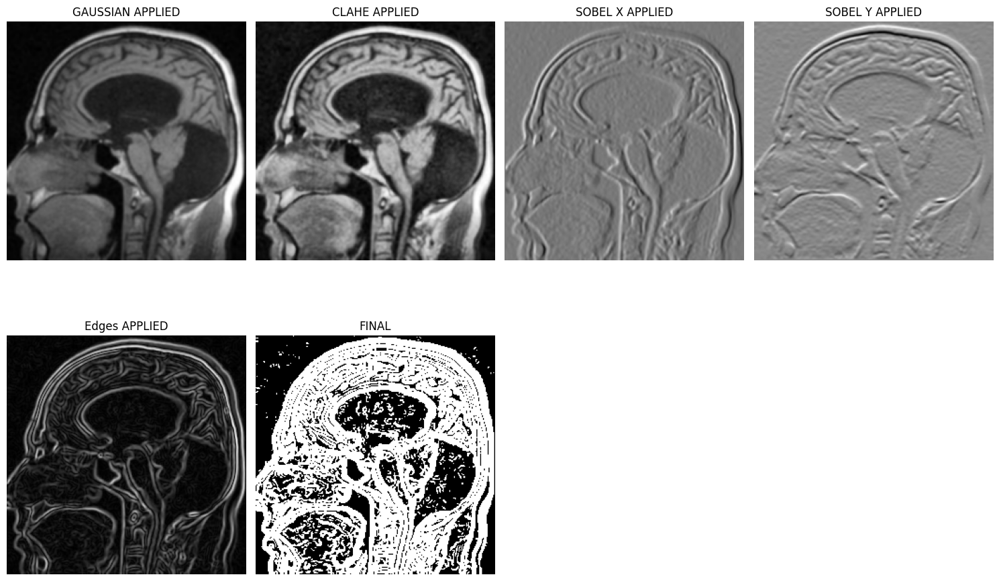

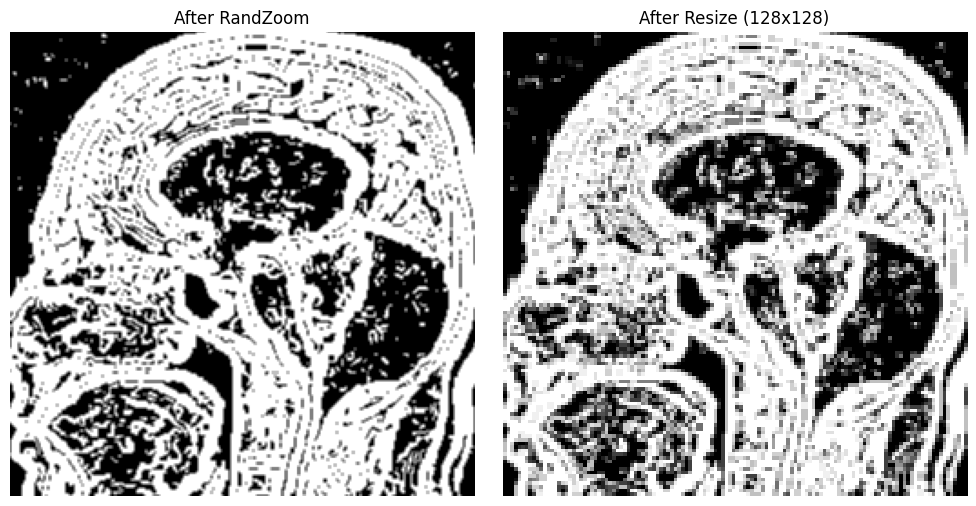

dimensions : 1, torch.Size([1, 128, 128])


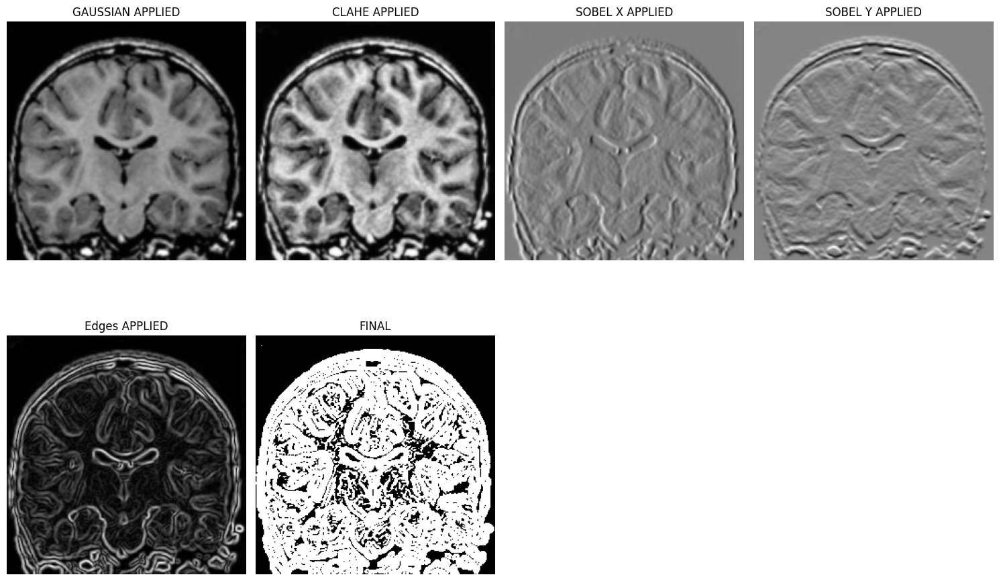

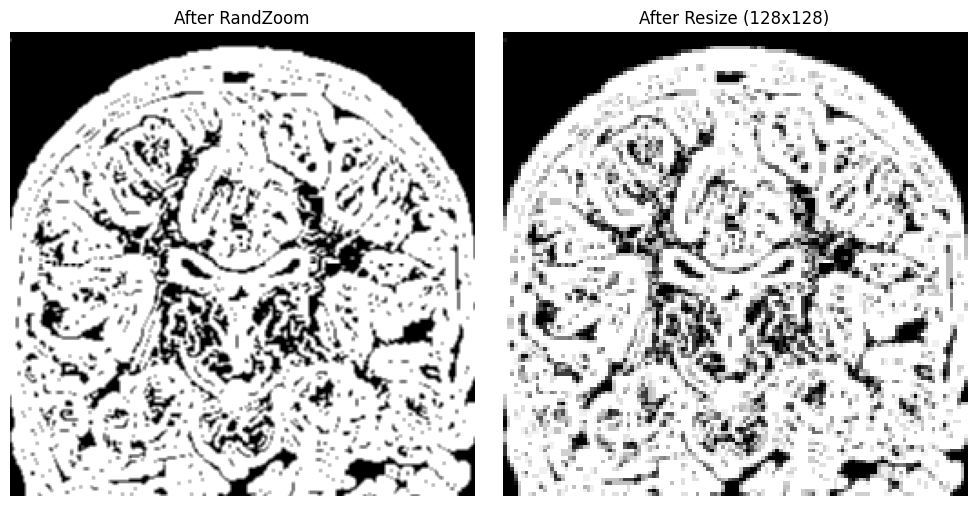

dimensions : 1, torch.Size([1, 128, 128])


In [155]:
zoom_transform = RandZoom(min_zoom=0.9, max_zoom=1.1, prob=1.0)
resize_transform = Resize(spatial_size=(128, 128))

for i in range(2):
    image_path = train_x[i]
    image = Image.open(image_path)

    # convertesc la numpy_array pentru a putea accesa dimensiunile
    image_np = np.array(image)

    # apelez custom_image_processing pentru a afisa pasii intermediari ai filtrelor aplicate
    steps = custom_image_processing(image_np, True)

    # afisez fiecare pas al transformărilor
    plt.figure(figsize=(15, 10))
    for j, (title, img) in enumerate(steps):
        plt.subplot(2, len(steps) // 2 + 1, j + 1)
        plt.imshow(img.squeeze(), cmap='gray')
        plt.title(title)
        plt.axis("off")
    plt.tight_layout()
    plt.show()

    rib_image = custom_image_processing(image_np, False)

    # aplic RandZoom pe rib_image
    zoomed_image = zoom_transform(rib_image)

    # aplic Resize la 128x128 pe imaginea zoomată
    resized_image = resize_transform(zoomed_image)

    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.imshow(zoomed_image.squeeze(), cmap='gray')
    plt.title("After RandZoom")
    plt.axis("off")
    plt.subplot(1, 2, 2)
    plt.imshow(resized_image.squeeze(), cmap='gray')
    plt.title("After Resize (128x128)")
    plt.axis("off")
    plt.tight_layout()
    plt.show()

    num_channels = resized_image.shape[0] if len(resized_image.shape) > 2 else 1  # numărul de canale
    img_shape = resized_image.shape  # dimensiunea imaginii

    print(f"dimensions : {num_channels}, {img_shape}")



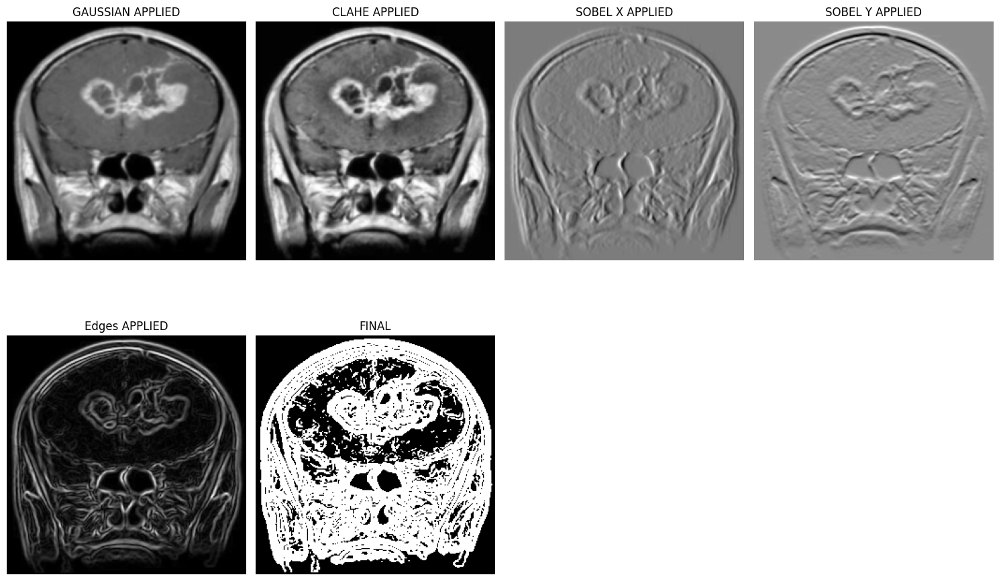

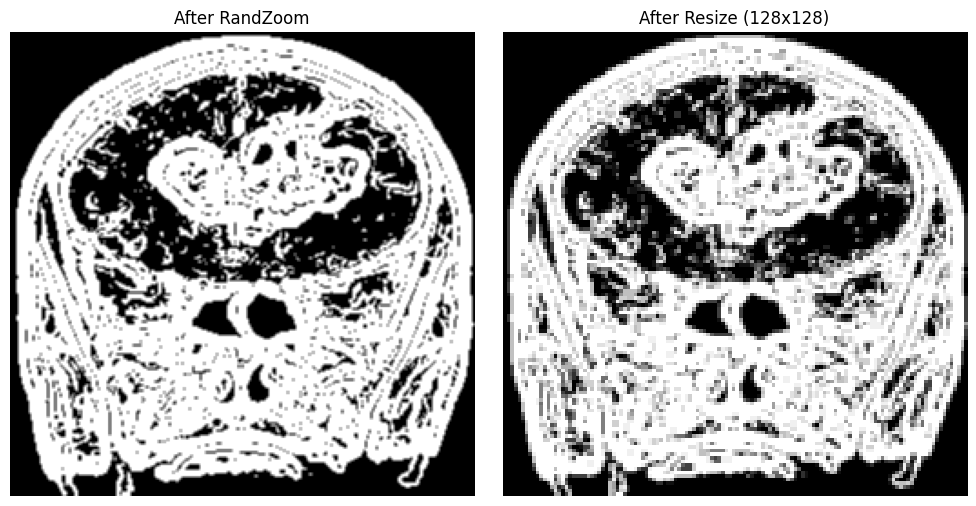

dimensions : 1, torch.Size([1, 128, 128])


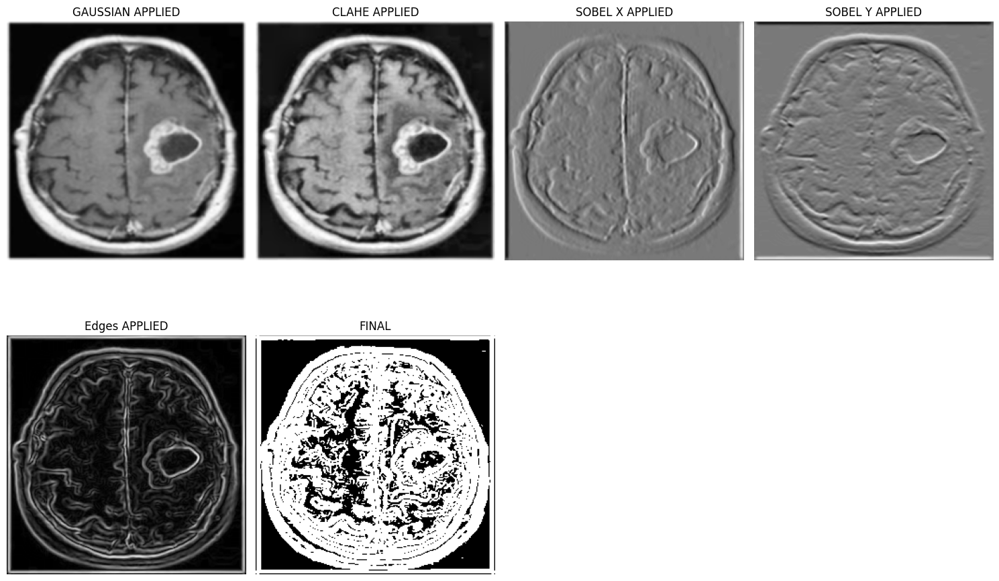

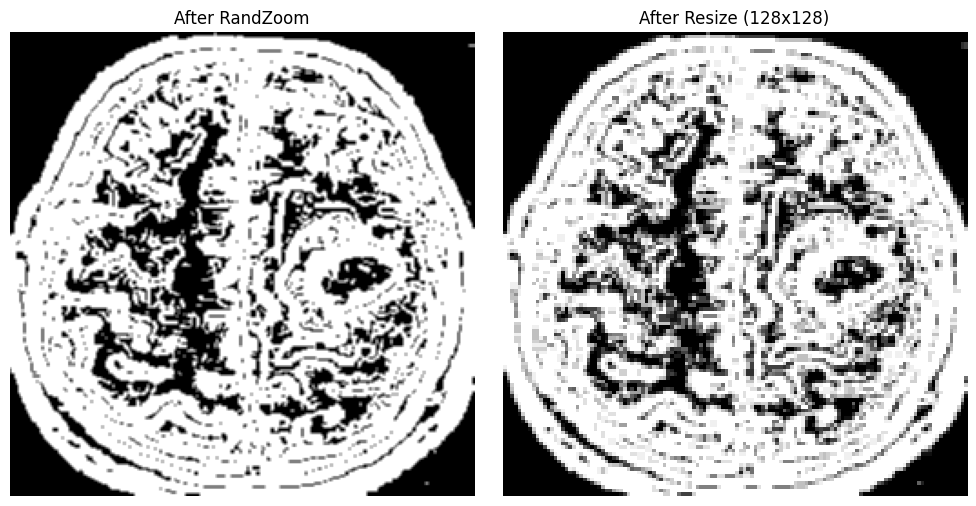

dimensions : 1, torch.Size([1, 128, 128])


In [156]:
zoom_transform = RandZoom(min_zoom=0.9, max_zoom=1.1, prob=1.0)
resize_transform = Resize(spatial_size=(128, 128))

for i in range(2):
    image_path = test_x[i]
    image = Image.open(image_path)

    # convertesc la numpy_array pentru a putea accesa dimensiunile
    image_np = np.array(image)

    # apelez custom_image_processing pentru a afisa pasii intermediari ai filtrelor aplicate
    steps = custom_image_processing(image_np, True)

    # afisez fiecare pas al transformărilor
    plt.figure(figsize=(15, 10))
    for j, (title, img) in enumerate(steps):
        plt.subplot(2, len(steps) // 2 + 1, j + 1)
        plt.imshow(img.squeeze(), cmap='gray')
        plt.title(title)
        plt.axis("off")
    plt.tight_layout()
    plt.show()

    rib_image = custom_image_processing(image_np, False)

    # aplic RandZoom pe rib_image
    zoomed_image = zoom_transform(rib_image)

    # aplic Resize la 128x128 pe imaginea zoomată
    resized_image = resize_transform(zoomed_image)

    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.imshow(zoomed_image.squeeze(), cmap='gray')
    plt.title("After RandZoom")
    plt.axis("off")
    plt.subplot(1, 2, 2)
    plt.imshow(resized_image.squeeze(), cmap='gray')
    plt.title("After Resize (128x128)")
    plt.axis("off")
    plt.tight_layout()
    plt.show()


    num_channels = resized_image.shape[0] if len(resized_image.shape) > 2 else 1  # numărul de canale
    img_shape = resized_image.shape  # dimensiunea imaginii

    print(f"dimensions : {num_channels}, {img_shape}")

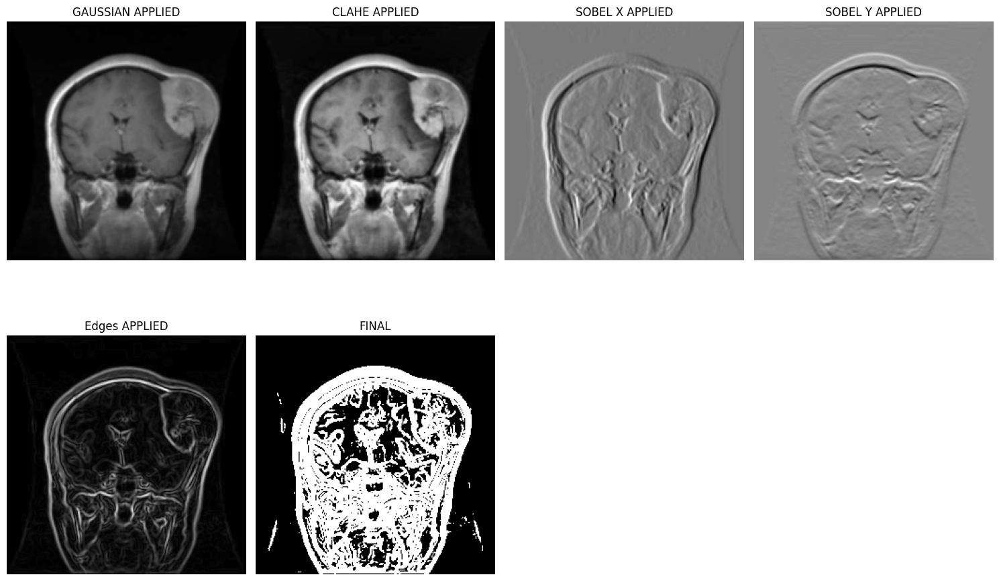

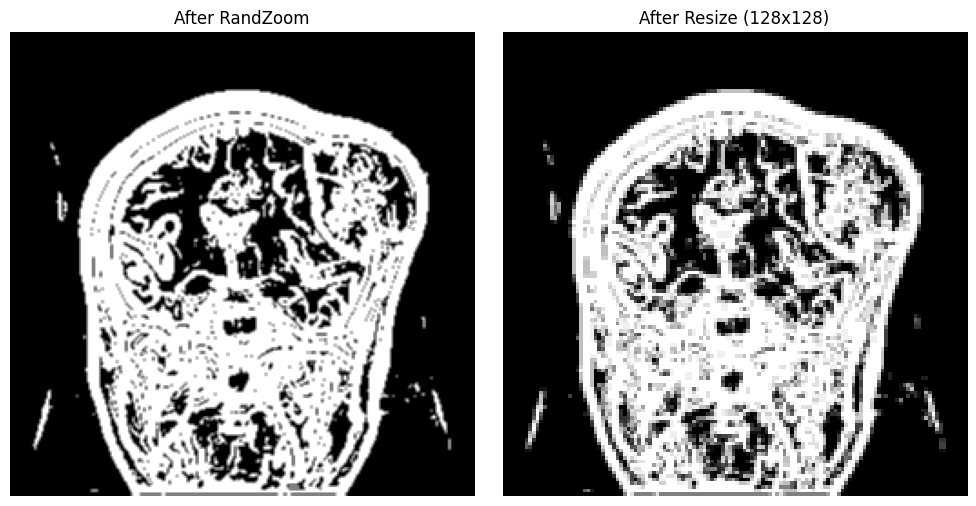

dimensions : 1, torch.Size([1, 128, 128])


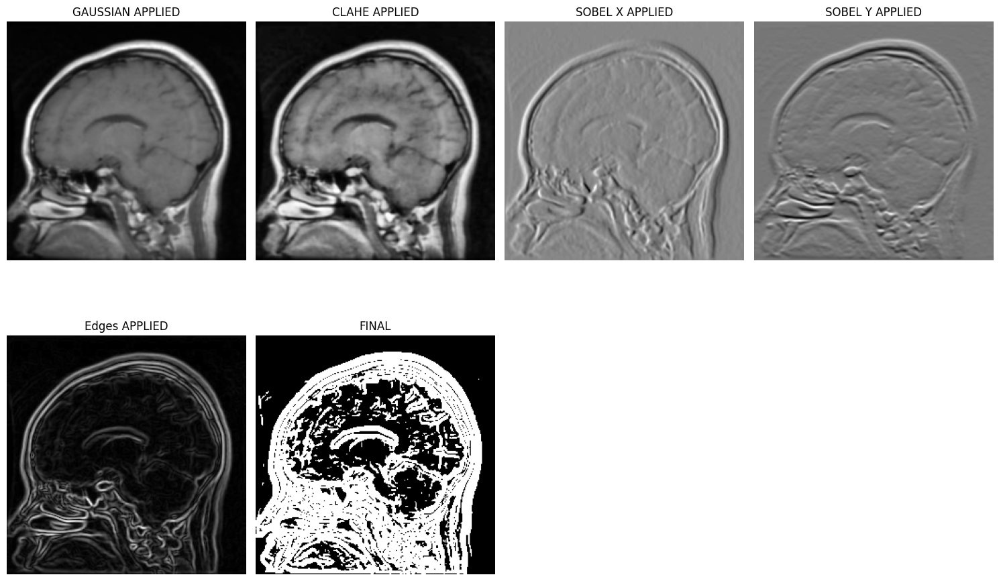

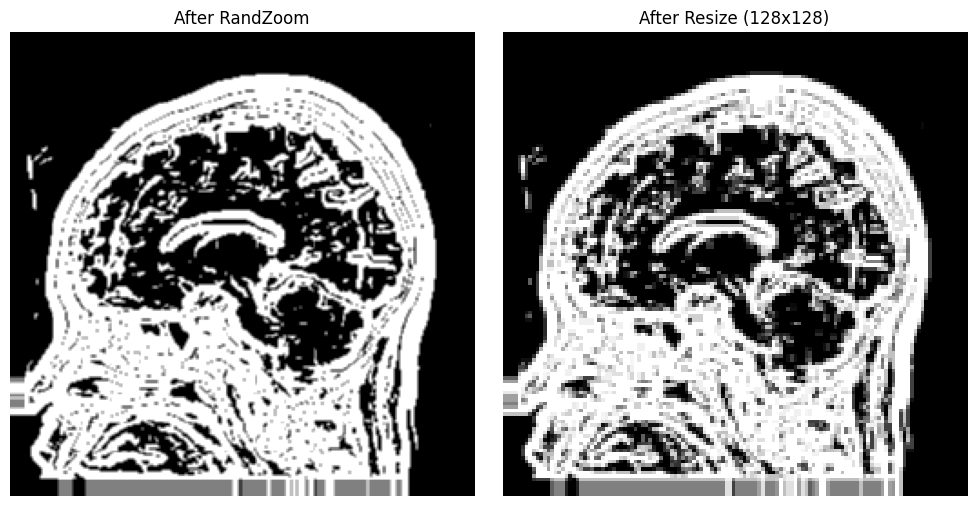

dimensions : 1, torch.Size([1, 128, 128])


In [157]:
zoom_transform = RandZoom(min_zoom=0.9, max_zoom=1.1, prob=1.0)
resize_transform = Resize(spatial_size=(128, 128))

for i in range(2):
    image_path = val_x[i]
    image = Image.open(image_path)

    # convertesc la numpy_array pentru a putea accesa dimensiunile
    image_np = np.array(image)

    # apelez custom_image_processing pentru a afisa pasii intermediari ai filtrelor aplicate
    steps = custom_image_processing(image_np, True)

    # afisez fiecare pas al transformărilor
    plt.figure(figsize=(15, 10))
    for j, (title, img) in enumerate(steps):
        plt.subplot(2, len(steps) // 2 + 1, j + 1)
        plt.imshow(img.squeeze(), cmap='gray')
        plt.title(title)
        plt.axis("off")
    plt.tight_layout()
    plt.show()

    rib_image = custom_image_processing(image_np, False)

    # aplic RandZoom pe rib_image
    zoomed_image = zoom_transform(rib_image)

    # aplic Resize la 128x128 pe imaginea zoomată
    resized_image = resize_transform(zoomed_image)

    plt.figure(figsize=(10, 5))
    plt.subplot(1, 2, 1)
    plt.imshow(zoomed_image.squeeze(), cmap='gray')
    plt.title("After RandZoom")
    plt.axis("off")
    plt.subplot(1, 2, 2)
    plt.imshow(resized_image.squeeze(), cmap='gray')
    plt.title("After Resize (128x128)")
    plt.axis("off")
    plt.tight_layout()
    plt.show()

    num_channels = resized_image.shape[0] if len(resized_image.shape) > 2 else 1  # numărul de canale
    img_shape = resized_image.shape  # dimensiunea imaginii

    print(f"dimensions : {num_channels}, {img_shape}")



**CERINTA 7**

**FOLOSIREA MODELULUI NEURAL PENTRU INITIALIZAREA TRANSFORAMRILOR**

In [158]:
import torch
import torch.nn as nn
from torchvision import models

class ResNet18Custom(nn.Module):
    def __init__(self, num_classes, dropout_prob=0.5):
        super(ResNet18Custom, self).__init__()

        # initializez modelul ResNet-18 preantrenat pe partea de imagistica Imagenet
        self.model = models.resnet18(pretrained=True)

        self.model.conv1 = nn.Conv2d(1, 64, kernel_size=7, stride=2, padding=3, bias=False) # schimb primul strat pentru a se potrivi cu numarul de canale egal cu 1, intrucat eu am imagini de tip Grayscale

        in_features = self.model.fc.in_features
        self.model.fc = nn.Linear(in_features, num_classes) # modific ultimul strat pentru a fi corespunzator cu numarul meu de clase
        # self.model.fc = nn.Sequential(
        #     nn.Dropout(p=dropout_prob), # droput pentru cerinta 2.5
        #     nn.Linear(in_features, num_classes)) # modific ultimul strat pentru a fi corespunzator cu numarul meu de clase

    def forward(self, x):
        return self.model(x)

**FOLOSIM CUDA PENTRU OPTIMIZAREA RULARII**

In [159]:
model = ResNet18Custom(num_class_train) # folosesc numarul de clase de train initrucat este acelasi numar de clase atat pentru test cat si pentru validate
device = torch.device("cuda" if torch.cuda.is_available() else "cpu") # folosesc cuda daca este disponibil
model = model.to(device) # transfer modelul catre dispozitivul specificat (cuda sau cpu)
print(f"Modelul este rulat pe dispozitivul: {device}")

/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and may be removed in the future, please use 'weights' instead.
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/torchvision/models/_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and may be removed in the future. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


Modelul este rulat pe dispozitivul: cuda


**CA ALGORITM DE OPTIMIZARE FOLOSIM STOCHASTIC GRADIENT DESCENT SI CA FUNCTIE DE LOSS VOM FOLOSI CROSSENTRPYLOSS**

**PENTRU CERINTA 2.5 AM SCHIMBAT CROSSENTROPYLOSS CU BCEWithLogitsLoss si am schimbat learning rate de la 0.001 la 0.01 dupa care am schimbat si optimizatorul de la Adam la SGD**

In [126]:
optimizer = torch.optim.Adam(model.parameters(), lr=0.001) # ca optimizator am folosit Adam ("Adaptive Moment Estimation"). Ajusteaza rata de învatare pentru fiecare parametru pe baza unor estimari adaptive ale momentului primelor două momente ale gradientului (media si varianta gradientului)
# optimizer = torch.optim.Adam(model.parameters(), lr=0.01) # cerinta 2.5
# optimizer = torch.optim.SGD(model.parameters(), lr=0.001) # cerinta 2.5
# optimizer = torch.optim.SGD(model.parameters(), lr=0.01) # cerinta 2.5
sum_total = 0
for num in num_each_train:
  sum_total += num
weights = [sum_total / num for num in num_each_train]
weights_tensor = torch.tensor(weights, dtype=torch.float32)

#loss_function = torch.nn.CrossEntropyLoss() # am folosit pentru functia de loss, CrossEntropyLoss() ca in laborator
#loss_function = torch.nn.CrossEntropyLoss(weight=weights_tensor.to(device)) # functia de Loss CrossEntropyLoss cu ponderi
#loss_function = torch.nn.BCEWithLogitsLoss() # cerinta 2.5
loss_function = kornia.losses.FocalLoss(alpha=0.25, gamma=2.0, reduction='mean') # cerinta 2.5
# aici gamma ajuta la focalizarea pe exemplele dificile, iar alpha se refera la rezolvarea dezechilibrului intre clase, oferind o greutate diferita fiecarei clase


In [127]:
# antrenarea
max_epochs = 15
val_interval = 1
auc_metric = ROCAUCMetric()
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', patience=5, factor=0.1)  # am folosit scheduler pentru a adjusta rata de invatare pentru ca sa ajung la o solutie mai buna si pentru o antrenare eficienta

best_metric = -1
best_metric_epoch = -1
epoch_loss_values = []
metric_values = []
train_accuracy_values = []  # lista pentru acuratetea de antrenare
val_accuracy_values = []    # lista pentru acuratetea de validare
writer = SummaryWriter()

for epoch in range(max_epochs):
    print("-" * 10)
    print(f"epoch {epoch + 1}/{max_epochs}")
    model.train()
    epoch_loss = 0
    correct_train = 0  # numaram predictiile corecte pe setul de antrenare
    total_train = 0    # numaram exemplele totale
    step = 0
    for batch_data in train_loader:
        step += 1
        inputs, labels = batch_data[0].to(device), batch_data[1].to(device)
        # labels_onehot = torch.nn.functional.one_hot(labels, num_classes=4).float() # doar pentru cerinta 2.5 pentru BCE
        optimizer.zero_grad()
        outputs = model(inputs)

        loss = loss_function(outputs, labels)
        # loss = loss_function(outputs, labels_onehot) # doar pentru cerinta 2.5 pentru BCE
        loss.backward()
        optimizer.step()
        epoch_loss += loss.item()

        # calculam predictiile corecte pentru setul de antrenare
        _, preds = torch.max(outputs, 1)
        correct_train += (preds == labels).sum().item()
        total_train += labels.size(0)

        print(f"{step}/{len(train_ds) // train_loader.batch_size}, train_loss: {loss.item():.4f}")
        epoch_len = len(train_ds) // train_loader.batch_size
        writer.add_scalar("train_loss", loss.item(), epoch_len * epoch + step)
    epoch_loss /= step
    epoch_loss_values.append(epoch_loss)

    # calculam acuratetea pe setul de antrenare
    train_accuracy = correct_train / total_train
    train_accuracy_values.append(train_accuracy)
    print(f"epoch {epoch + 1} average loss: {epoch_loss:.4f}, train_accuracy: {train_accuracy:.4f}")

    if (epoch + 1) % val_interval == 0:
        model.eval()
        val_loss = 0
        correct_val = 0  # numaram predictiile corecte pe setul de validare
        total_val = 0    # numaram exemplele totale
        with torch.no_grad():
            y_pred = torch.tensor([], dtype=torch.float32, device=device)
            y = torch.tensor([], dtype=torch.long, device=device)
            for val_data in val_loader:
                val_images, val_labels = (
                    val_data[0].to(device),
                    val_data[1].to(device),
                )
                # val_labels_onehot = torch.nn.functional.one_hot(val_labels, num_classes=4).float() # doar pentru cerinta 2.5 pentru BCE

                outputs = model(val_images)
                val_loss += loss_function(outputs, val_labels).item()
                # val_loss += loss_function(outputs, val_labels_onehot).item() # doar pentru cerinta 2.5 pentru BCE
                y_pred = torch.cat([y_pred, outputs], dim=0)
                y = torch.cat([y, val_labels], dim=0)

                # calculam predictiile corecte pentru setul de validare
                _, preds = torch.max(outputs, 1)
                correct_val += (preds == val_labels).sum().item()
                total_val += val_labels.size(0)

            val_loss /= len(val_loader)

            # calculam metricile de validare
            val_accuracy = correct_val / total_val
            val_accuracy_values.append(val_accuracy)

            y_onehot = [y_trans(i) for i in decollate_batch(y, detach=False)]
            y_pred_act = [y_pred_trans(i) for i in decollate_batch(y_pred)]
            auc_metric(y_pred_act, y_onehot)
            result = auc_metric.aggregate()
            auc_metric.reset()
            del y_pred_act, y_onehot
            metric_values.append(result)

            # verificam dacă este cea mai buna metrica
            if result > best_metric:
                best_metric = result
                best_metric_epoch = epoch + 1
                torch.save(model.state_dict(), os.path.join(root_dir, "best_metric_model.pth"))
                print("saved new best metric model")
            print(
                f"current epoch: {epoch + 1} current AUC: {result:.4f}"
                f" current accuracy: {val_accuracy:.4f}"
                f" best AUC: {best_metric:.4f}"
                f" at epoch: {best_metric_epoch}"
            )
            writer.add_scalar("val_accuracy", val_accuracy, epoch + 1)
        scheduler.step(val_loss)

print(f"train completed, best_metric: {best_metric:.4f} at epoch: {best_metric_epoch}")
writer.close()


----------
epoch 1/15
1/28, train_loss: 0.1118
2/28, train_loss: 0.0878
3/28, train_loss: 0.1655
4/28, train_loss: 0.0674
5/28, train_loss: 0.0620
6/28, train_loss: 0.0828
7/28, train_loss: 0.0335
8/28, train_loss: 0.0770
9/28, train_loss: 0.0411
10/28, train_loss: 0.0582
11/28, train_loss: 0.0536
12/28, train_loss: 0.0289
13/28, train_loss: 0.0534
14/28, train_loss: 0.0415
15/28, train_loss: 0.0347
16/28, train_loss: 0.0169
17/28, train_loss: 0.0387
18/28, train_loss: 0.0465
19/28, train_loss: 0.0321
20/28, train_loss: 0.0302
21/28, train_loss: 0.0228
22/28, train_loss: 0.0357
23/28, train_loss: 0.0227
24/28, train_loss: 0.0305
25/28, train_loss: 0.0263
26/28, train_loss: 0.0193
27/28, train_loss: 0.0208
28/28, train_loss: 0.0317
29/28, train_loss: 0.0219
epoch 1 average loss: 0.0481, train_accuracy: 0.6168
saved new best metric model
current epoch: 1 current AUC: 0.7172 current accuracy: 0.3224 best AUC: 0.7172 at epoch: 1
----------
epoch 2/15
1/28, train_loss: 0.0339
2/28, train_lo

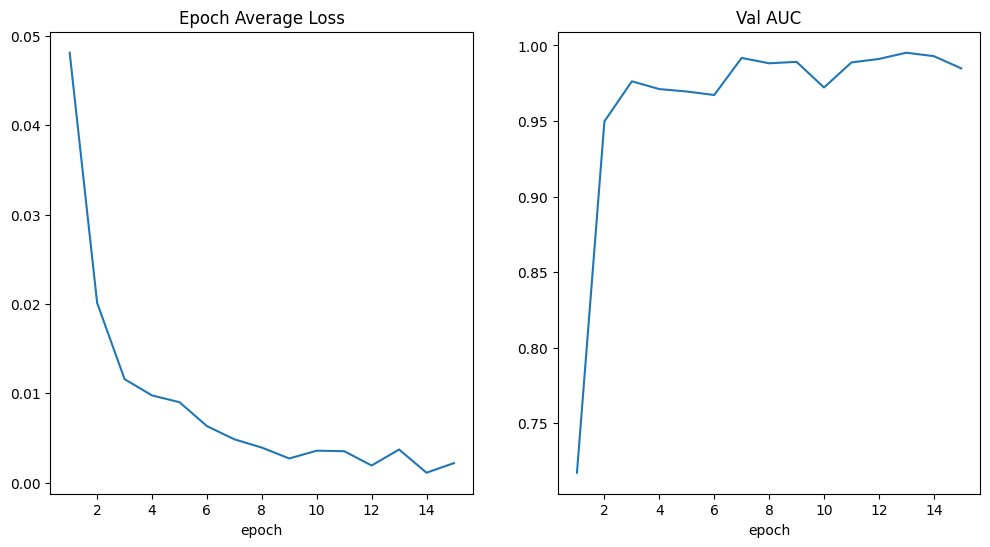

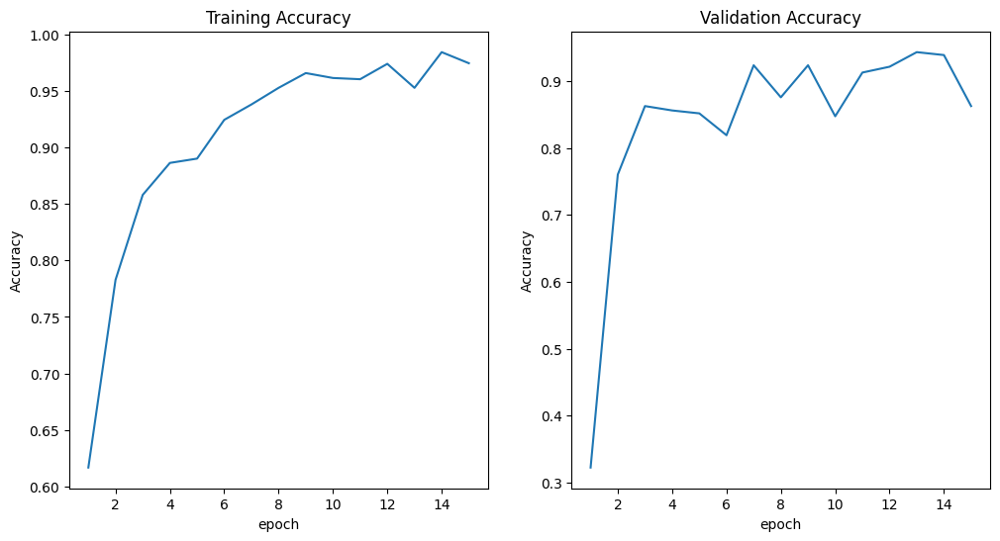

In [128]:
# aici afisez prin grafice pierderea si aria under curve in functie de numarul de epoci

plt.figure("train", (12, 6))
plt.subplot(1, 2, 1)
plt.title("Epoch Average Loss")
x = [i + 1 for i in range(len(epoch_loss_values))]
y = epoch_loss_values
plt.xlabel("epoch")
plt.plot(x, y)
plt.subplot(1, 2, 2)
plt.title("Val AUC")
x = [val_interval * (i + 1) for i in range(len(metric_values))]
y = metric_values
plt.xlabel("epoch")
plt.plot(x, y)
plt.show()

# aici afisez prin grafice acuratetea pentru train si acuratetea pentru validate

plt.figure("train", (12, 6))
plt.subplot(1, 2, 1)
plt.title("Training Accuracy")
x = [i + 1 for i in range(len(train_accuracy_values))]
y = train_accuracy_values
plt.xlabel("epoch")
plt.ylabel("Accuracy")
plt.plot(x, y, label="Training Accuracy")

plt.subplot(1, 2, 2)
plt.title("Validation Accuracy")
x = [i + 1 for i in range(len(val_accuracy_values))]
y = val_accuracy_values
plt.xlabel("epoch")
plt.ylabel("Accuracy")
plt.plot(x, y, label="Validation Accuracy")
plt.show()

In [129]:
model.load_state_dict(torch.load(os.path.join(root_dir, "best_metric_model.pth")))
model.eval()
y_true = []
y_pred = []
with torch.no_grad():
    for test_data in test_loader:
        test_images, test_labels = (
            test_data[0].to(device),
            test_data[1].to(device),
        )
        pred = model(test_images).argmax(dim=1)
        for i in range(len(pred)):
            y_true.append(test_labels[i].item())
            y_pred.append(pred[i].item())
print(classification_report(y_true, y_pred, target_names=class_names_train, digits=4))

# aici am afisat acuratetea, f1-score recall si precision

<ipython-input-129-1d639b5ae917>:1: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(os.path.join(root_dir, "best_metric_model.pth")))


                  precision    recall  f1-score   support

    glioma_tumor     0.9000    0.1800    0.3000       100
meningioma_tumor     0.6667    0.9739    0.7915       115
        no_tumor     0.6623    0.9714    0.7876       105
 pituitary_tumor     0.9423    0.6622    0.7778        74

        accuracy                         0.7132       394
       macro avg     0.7928    0.6969    0.6642       394
    weighted avg     0.7765    0.7132    0.6632       394



**MATRICEA DE CONFUZIE**

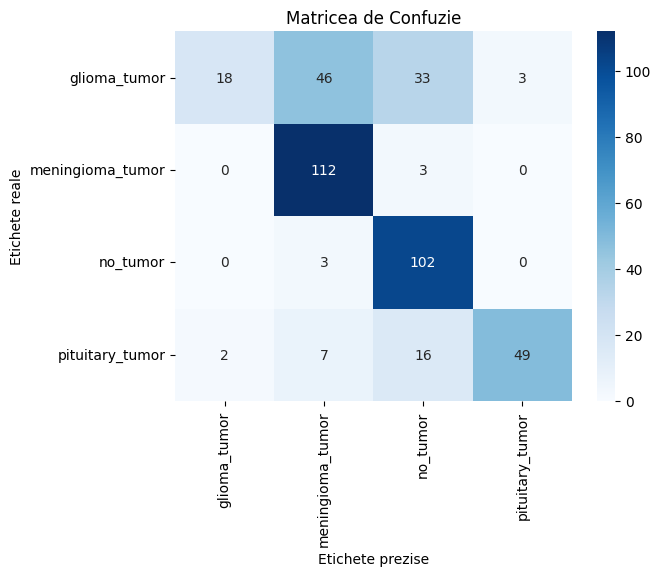

In [130]:
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn.metrics import confusion_matrix, ConfusionMatrixDisplay

# matricea de confuzie calculata pe y_true si y_pred rezultate de la metricile afisate mai devreme
cm = confusion_matrix(y_true, y_pred)

sns.heatmap(cm, annot=True, fmt="d", cmap="Blues", xticklabels=class_names_train, yticklabels=class_names_train) # ca nume de clase le-am folosit pe cele de la train intrucat sunt la fel pentru toate
plt.xlabel("Etichete prezise")
plt.ylabel("Etichete reale")
plt.title("Matricea de Confuzie")
plt.show()

# randurile reprezinta elementele reale adica valorile reale
# coloanele reprezinta elementele prezise adica valorile prezise

**CERINTA 2.1**

**ANTRENAREA FOLDURILOR DIN TRAIN PE VALIDATE SI AFISAREA METRICILOR DE EVALUARE PLUS GRAFICE DE EVOLUTIE PE PARCURSUL EPOCILOR**

In [131]:
from sklearn.model_selection import StratifiedKFold

In [132]:
k = 5
skf = StratifiedKFold(n_splits=k, shuffle=True, random_state=42)

In [133]:
pairs_folds = []

for fold, (train_idx, val_idx) in enumerate(skf.split(train_x, train_y)):
    print(f"Fold {fold + 1}/{k}")

    train_x_fold = [train_x[i] for i in train_idx]
    train_y_fold = [train_y[i] for i in train_idx]

    val_x_fold = [train_x[i] for i in val_idx]
    val_y_fold = [train_y[i] for i in val_idx]
    pairs_folds.append((train_x_fold, train_y_fold, val_x_fold, val_y_fold))

print(len(pairs_folds))

Fold 1/5
Fold 2/5
Fold 3/5
Fold 4/5
Fold 5/5
5


In [134]:
train_ds_loader_list = []

for pair in pairs_folds:
  train_ds = BrainTumorDataset(pair[0], pair[1], train_transforms)
  # train_loader = DataLoader(train_ds, batch_size=32, shuffle=True, num_workers=10)
  train_loader = DataLoader(train_ds, batch_size=64, shuffle=True, num_workers=10)

  val_ds = BrainTumorDataset(pair[2], pair[3], val_transforms)
  # val_loader = DataLoader(val_ds, batch_size=32, shuffle=False, num_workers=10)
  val_loader = DataLoader(val_ds, batch_size=64, shuffle=False, num_workers=10)

  train_ds_loader_list.append((train_loader, val_loader))

In [135]:
results_per_fold = {
    "train_accuracy": [],
    "val_accuracy": [],
    "precision": [],
    "recall": [],
    "f1_score": [],
    "test_accuracy": [],
}


In [136]:
vals_for_plots_per_fold = {}
for i in range(k):
    vals_for_plots_per_fold[f"fold_{i + 1}"] = {
        "epoch_loss_values": [],
        "train_accuracy_values": [],
        "val_accuracy_values": []
    }

In [138]:
auc_per_fold = {}

======== Fold 1/5 ========
----------
epoch 1/15
1/28, train_loss: 0.0018
2/28, train_loss: 0.0035
3/28, train_loss: 0.0007
4/28, train_loss: 0.0013
5/28, train_loss: 0.0018
6/28, train_loss: 0.0013
7/28, train_loss: 0.0033
8/28, train_loss: 0.0012
9/28, train_loss: 0.0070
10/28, train_loss: 0.0011
11/28, train_loss: 0.0008
12/28, train_loss: 0.0028
13/28, train_loss: 0.0022
14/28, train_loss: 0.0012
15/28, train_loss: 0.0012
16/28, train_loss: 0.0066
17/28, train_loss: 0.0005
18/28, train_loss: 0.0007
19/28, train_loss: 0.0024
20/28, train_loss: 0.0021
21/28, train_loss: 0.0005
22/28, train_loss: 0.0014
23/28, train_loss: 0.0009
24/28, train_loss: 0.0025
25/28, train_loss: 0.0037
26/28, train_loss: 0.0010
27/28, train_loss: 0.0011
28/28, train_loss: 0.0024
29/28, train_loss: 0.0005
epoch 1 average loss: 0.0020, train_accuracy: 0.9700
saved new best metric model
current epoch: 1 current AUC: 0.9996 current accuracy: 0.9565 best AUC: 0.9996 at epoch: 1
----------
epoch 2/15
1/28, train_

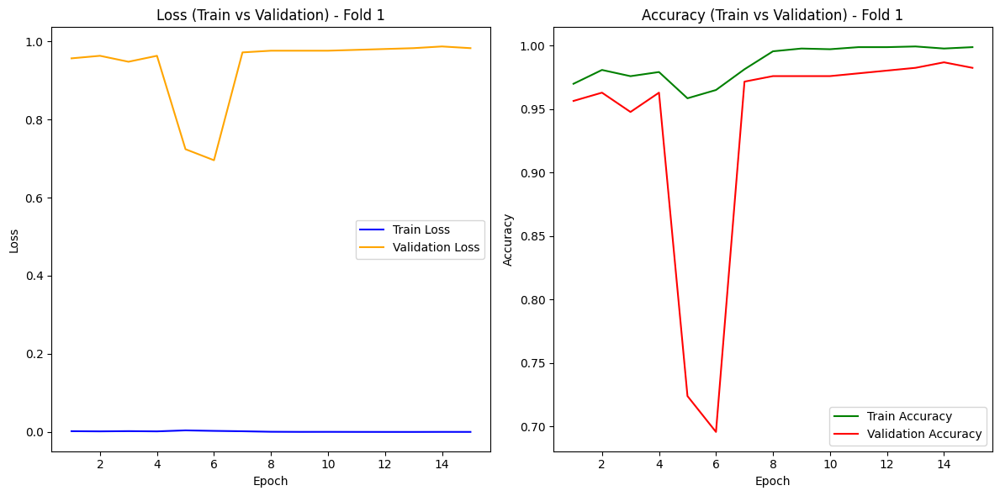

======== Fold 2/5 ========
----------
epoch 1/15
1/28, train_loss: 0.0002
2/28, train_loss: 0.0000
3/28, train_loss: 0.0004
4/28, train_loss: 0.0012
5/28, train_loss: 0.0001
6/28, train_loss: 0.0030
7/28, train_loss: 0.0001
8/28, train_loss: 0.0002
9/28, train_loss: 0.0055
10/28, train_loss: 0.0002
11/28, train_loss: 0.0002
12/28, train_loss: 0.0002
13/28, train_loss: 0.0000
14/28, train_loss: 0.0001
15/28, train_loss: 0.0012
16/28, train_loss: 0.0019
17/28, train_loss: 0.0000
18/28, train_loss: 0.0000
19/28, train_loss: 0.0000
20/28, train_loss: 0.0001
21/28, train_loss: 0.0000
22/28, train_loss: 0.0001
23/28, train_loss: 0.0001
24/28, train_loss: 0.0003
25/28, train_loss: 0.0001
26/28, train_loss: 0.0000
27/28, train_loss: 0.0000
28/28, train_loss: 0.0004
29/28, train_loss: 0.0001
epoch 1 average loss: 0.0006, train_accuracy: 0.9940
saved new best metric model
current epoch: 1 current AUC: 1.0000 current accuracy: 1.0000 best AUC: 1.0000 at epoch: 1
----------
epoch 2/15
1/28, train_

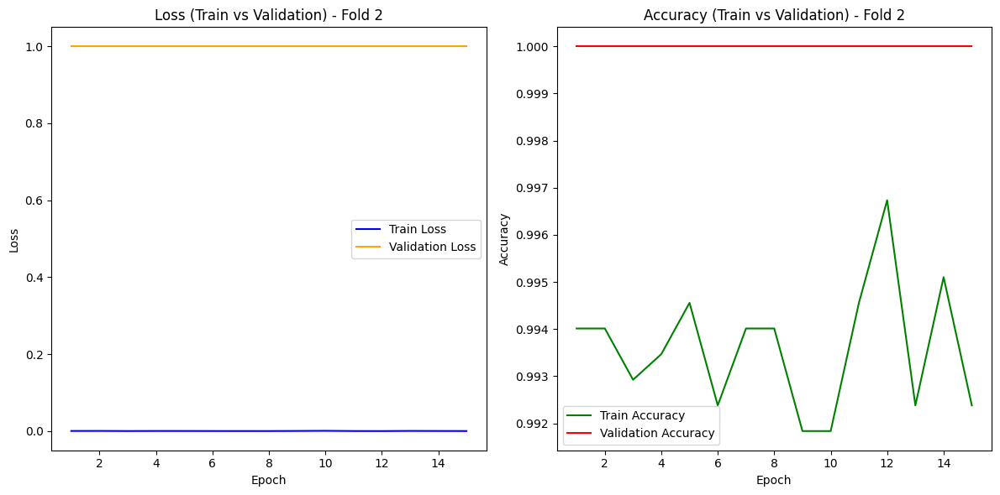

======== Fold 3/5 ========
----------
epoch 1/15
1/28, train_loss: 0.0004
2/28, train_loss: 0.0001
3/28, train_loss: 0.0002
4/28, train_loss: 0.0001
5/28, train_loss: 0.0000
6/28, train_loss: 0.0001
7/28, train_loss: 0.0022
8/28, train_loss: 0.0001
9/28, train_loss: 0.0000
10/28, train_loss: 0.0000
11/28, train_loss: 0.0003
12/28, train_loss: 0.0007
13/28, train_loss: 0.0007
14/28, train_loss: 0.0026
15/28, train_loss: 0.0015
16/28, train_loss: 0.0010
17/28, train_loss: 0.0002
18/28, train_loss: 0.0000
19/28, train_loss: 0.0001
20/28, train_loss: 0.0022
21/28, train_loss: 0.0001
22/28, train_loss: 0.0009
23/28, train_loss: 0.0000
24/28, train_loss: 0.0002
25/28, train_loss: 0.0000
26/28, train_loss: 0.0000
27/28, train_loss: 0.0000
28/28, train_loss: 0.0003
29/28, train_loss: 0.0000
epoch 1 average loss: 0.0005, train_accuracy: 0.9940
saved new best metric model
current epoch: 1 current AUC: 1.0000 current accuracy: 1.0000 best AUC: 1.0000 at epoch: 1
----------
epoch 2/15
1/28, train_

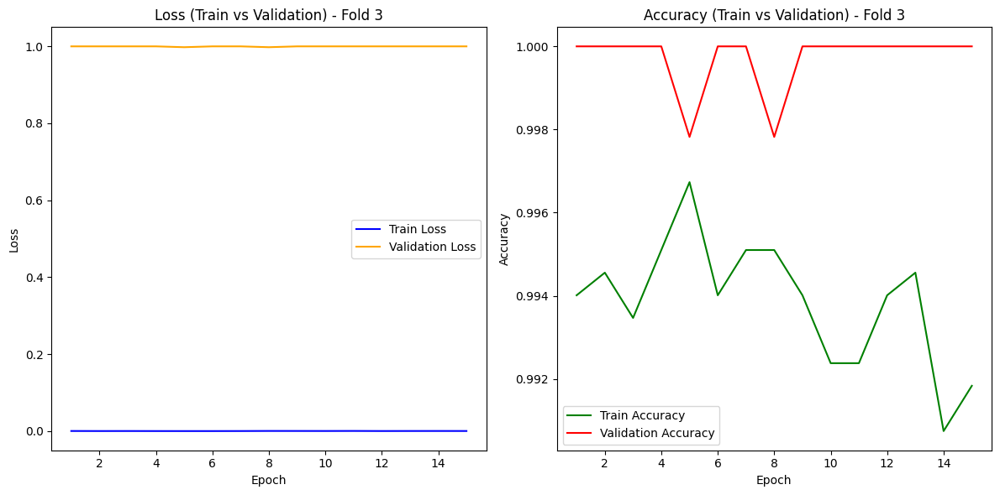

======== Fold 4/5 ========
----------
epoch 1/15
1/28, train_loss: 0.0000
2/28, train_loss: 0.0000
3/28, train_loss: 0.0001
4/28, train_loss: 0.0005
5/28, train_loss: 0.0004
6/28, train_loss: 0.0000
7/28, train_loss: 0.0001
8/28, train_loss: 0.0001
9/28, train_loss: 0.0001
10/28, train_loss: 0.0007
11/28, train_loss: 0.0000
12/28, train_loss: 0.0001
13/28, train_loss: 0.0002
14/28, train_loss: 0.0009
15/28, train_loss: 0.0000
16/28, train_loss: 0.0001
17/28, train_loss: 0.0000
18/28, train_loss: 0.0001
19/28, train_loss: 0.0009
20/28, train_loss: 0.0002
21/28, train_loss: 0.0003
22/28, train_loss: 0.0036
23/28, train_loss: 0.0001
24/28, train_loss: 0.0002
25/28, train_loss: 0.0001
26/28, train_loss: 0.0000
27/28, train_loss: 0.0001
28/28, train_loss: 0.0000
29/28, train_loss: 0.0033
epoch 1 average loss: 0.0004, train_accuracy: 0.9946
saved new best metric model
current epoch: 1 current AUC: 1.0000 current accuracy: 0.9978 best AUC: 1.0000 at epoch: 1
----------
epoch 2/15
1/28, train_

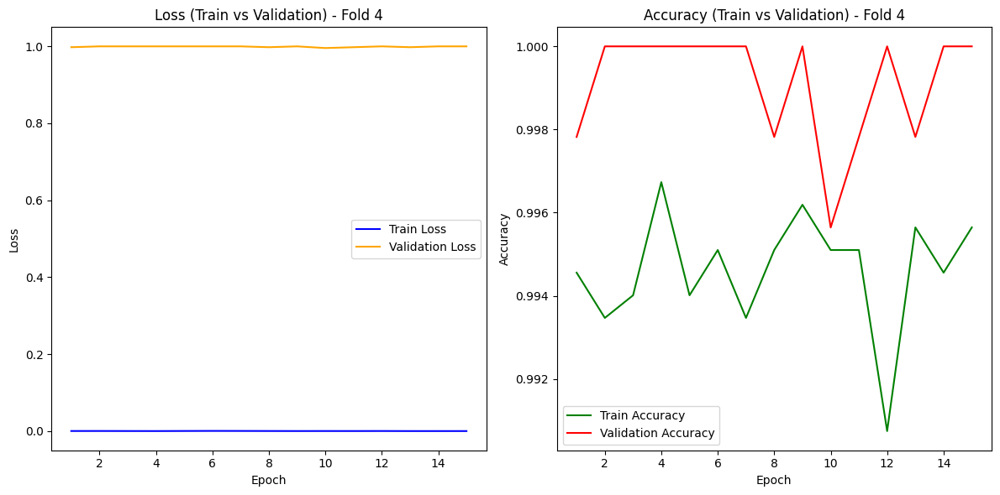

======== Fold 5/5 ========
----------
epoch 1/15
1/28, train_loss: 0.0004
2/28, train_loss: 0.0000
3/28, train_loss: 0.0012
4/28, train_loss: 0.0000
5/28, train_loss: 0.0021
6/28, train_loss: 0.0002
7/28, train_loss: 0.0000
8/28, train_loss: 0.0024
9/28, train_loss: 0.0000
10/28, train_loss: 0.0000
11/28, train_loss: 0.0001
12/28, train_loss: 0.0001
13/28, train_loss: 0.0001
14/28, train_loss: 0.0002
15/28, train_loss: 0.0002
16/28, train_loss: 0.0023
17/28, train_loss: 0.0001
18/28, train_loss: 0.0009
19/28, train_loss: 0.0005
20/28, train_loss: 0.0003
21/28, train_loss: 0.0007
22/28, train_loss: 0.0001
23/28, train_loss: 0.0001
24/28, train_loss: 0.0012
25/28, train_loss: 0.0008
26/28, train_loss: 0.0001
27/28, train_loss: 0.0000
28/28, train_loss: 0.0005
29/28, train_loss: 0.0025
epoch 1 average loss: 0.0006, train_accuracy: 0.9924
saved new best metric model
current epoch: 1 current AUC: 1.0000 current accuracy: 1.0000 best AUC: 1.0000 at epoch: 1
----------
epoch 2/15
1/28, train_

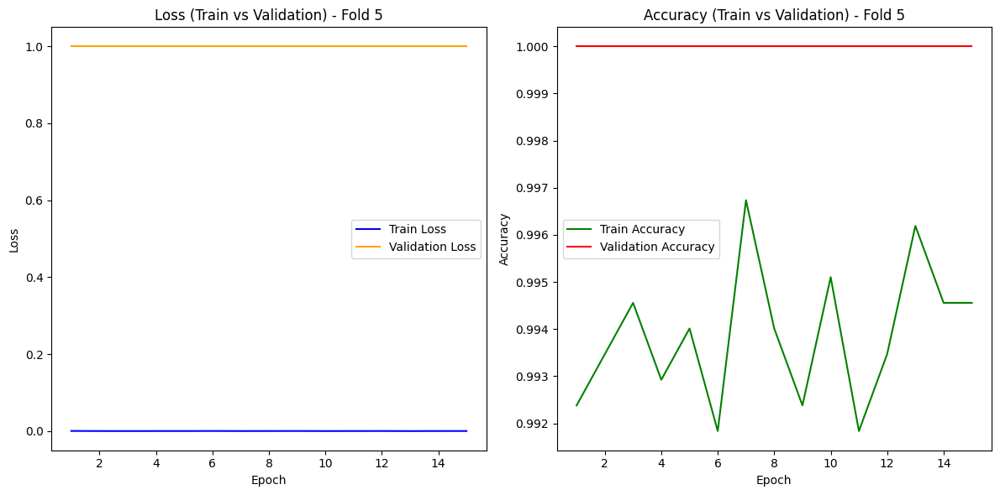

In [139]:
# antrenarea cu folduri
max_epochs = 15
val_interval = 1
auc_metric = ROCAUCMetric()
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer, mode='min', patience=3, factor=0.1)  # am folosit scheduler pentru a adjusta rata de invatare pentru ca sa ajung la o solutie mai buna si pentru o antrenare eficienta


results_per_fold = []

for fold, (train_loader, val_loader) in enumerate(train_ds_loader_list):
    print(f"======== Fold {fold + 1}/{k} ========")
    best_metric = -1
    best_metric_epoch = -1
    epoch_loss_values = []
    metric_values = []
    train_accuracy_values = []  # lista pentru acuratetea de antrenare
    val_accuracy_values = []    # lista pentru acuratetea de validare
    writer = SummaryWriter()

    for epoch in range(max_epochs):
        print("-" * 10)
        print(f"epoch {epoch + 1}/{max_epochs}")
        model.train()
        epoch_loss = 0
        correct_train = 0  # numaram predictiile corecte pe setul de antrenare
        total_train = 0    # numaram exemplele totale
        step = 0
        for batch_data in train_loader:
            step += 1
            inputs, labels = batch_data[0].to(device), batch_data[1].to(device)
            # labels_onehot = torch.nn.functional.one_hot(labels, num_classes=4).float() # doar pentru cerinta 2.5 pentru BCE
            optimizer.zero_grad()
            outputs = model(inputs)
            loss = loss_function(outputs, labels)
            # loss = loss_function(outputs, labels_onehot) # doar pentru cerinta 2.5 pentru BCE
            loss.backward()
            optimizer.step()
            epoch_loss += loss.item()

            # calculam predictiile corecte pentru setul de antrenare
            _, preds = torch.max(outputs, 1)
            correct_train += (preds == labels).sum().item()
            total_train += labels.size(0)

            print(f"{step}/{len(train_ds) // train_loader.batch_size}, train_loss: {loss.item():.4f}")
            epoch_len = len(train_ds) // train_loader.batch_size
            writer.add_scalar("train_loss", loss.item(), epoch_len * epoch + step)
        epoch_loss /= step
        epoch_loss_values.append(epoch_loss)
        vals_for_plots_per_fold[f"fold_{fold + 1}"]["epoch_loss_values"].append(epoch_loss_values)

        # calculam acuratetea pe setul de antrenare
        train_accuracy = correct_train / total_train
        train_accuracy_values.append(train_accuracy)
        vals_for_plots_per_fold[f"fold_{fold + 1}"]["train_accuracy_values"].append(train_accuracy_values)
        print(f"epoch {epoch + 1} average loss: {epoch_loss:.4f}, train_accuracy: {train_accuracy:.4f}")

        if (epoch + 1) % val_interval == 0:
            model.eval()
            val_loss = 0
            correct_val = 0  # numaram predictiile corecte pe setul de validare
            total_val = 0    # numaram exemplele totale
            y_pred_class = []  # lista pentru predicții
            y_true_class = []  # lista pentru etichete reale

            with torch.no_grad():
                y_pred = torch.tensor([], dtype=torch.float32, device=device)
                y = torch.tensor([], dtype=torch.long, device=device)
                for val_data in val_loader:
                    val_images, val_labels = (
                        val_data[0].to(device),
                        val_data[1].to(device),
                    )
                    # val_labels_onehot = torch.nn.functional.one_hot(val_labels, num_classes=4).float() # doar pentru cerinta 2.5 pentru BCE
                    outputs = model(val_images)
                    val_loss += loss_function(outputs, val_labels).item()
                    # val_loss += loss_function(outputs, val_labels_onehot).item() # doar pentru cerinta 2.5 pentru BCE
                    y_pred = torch.cat([y_pred, outputs], dim=0)
                    y = torch.cat([y, val_labels], dim=0)

                    # calculam predictiile corecte pentru setul de validare
                    _, preds = torch.max(outputs, 1)
                    y_pred_class.extend(preds.cpu().numpy())  # salvăm predicțiile
                    y_true_class.extend(val_labels.cpu().numpy())  # salvăm etichetele reale
                    correct_val += (preds == val_labels).sum().item()
                    total_val += val_labels.size(0)

                val_loss /= len(val_loader)

                # calculam metricile de validare
                val_accuracy = correct_val / total_val
                val_accuracy_values.append(val_accuracy)
                vals_for_plots_per_fold[f"fold_{fold + 1}"]["val_accuracy_values"].append(val_accuracy_values)

                y_onehot = [y_trans(i) for i in decollate_batch(y, detach=False)]
                y_pred_act = [y_pred_trans(i) for i in decollate_batch(y_pred)]
                auc_metric(y_pred_act, y_onehot)
                result = auc_metric.aggregate()
                if f"Fold_{fold + 1}" not in auc_per_fold:
                    auc_per_fold[f"Fold_{fold + 1}"] = []
                else:
                    auc_per_fold[f"Fold_{fold + 1}"].append(result)
                auc_metric.reset()
                del y_pred_act, y_onehot
                metric_values.append(result)

                # verificam dacă este cea mai buna metrica
                if result > best_metric:
                    best_metric = result
                    best_metric_epoch = epoch + 1
                    torch.save(model.state_dict(), os.path.join(root_dir, f"best_metric_model_fold_{fold + 1}.pth"))
                    print("saved new best metric model")
                print(
                    f"current epoch: {epoch + 1} current AUC: {result:.4f}"
                    f" current accuracy: {val_accuracy:.4f}"
                    f" best AUC: {best_metric:.4f}"
                    f" at epoch: {best_metric_epoch}"
                )
                writer.add_scalar("val_accuracy", val_accuracy, epoch + 1)
            scheduler.step(result)

    print(f"Classification report for fold {fold + 1}:")
    report = classification_report(y_true_class, y_pred_class, target_names=class_names_train, digits=4)
    print(report)
    results_per_fold.append(report)
    writer.close()

    # aici afisez prin grafice pierderea si aria under curve in functie de numarul de epoci pentru fiecare fold in parte
    plt.figure(figsize=(12, 6))

    # subgrafic pentru compararea pierderilor (Train vs Validation Loss)
    plt.subplot(1, 2, 1)
    plt.title(f"Loss (Train vs Validation) - Fold {fold + 1}")
    plt.plot(range(1, len(epoch_loss_values) + 1), epoch_loss_values, label="Train Loss", color="blue")
    plt.plot(range(1, len(val_accuracy_values) + 1), [val_loss for val_loss in val_accuracy_values],
            label="Validation Loss", color="orange")
    plt.xlabel("Epoch")
    plt.ylabel("Loss")
    plt.legend()

    # subgrafic pentru compararea acurateții (Train vs Validation Accuracy)
    plt.subplot(1, 2, 2)
    plt.title(f"Accuracy (Train vs Validation) - Fold {fold + 1}")
    plt.plot(range(1, len(train_accuracy_values) + 1), train_accuracy_values, label="Train Accuracy", color="green")
    plt.plot(range(1, len(val_accuracy_values) + 1), val_accuracy_values, label="Validation Accuracy", color="red")
    plt.xlabel("Epoch")
    plt.ylabel("Accuracy")
    plt.legend()

    plt.tight_layout()
    plt.show()




In [140]:
from statistics import mean, stdev

metrics = {"precision": [], "recall": [], "f1-score": [], "accuracy": []}

for fold_report in results_per_fold:
    # Extragem metricile relevante din raportul de clasificare
    lines = fold_report.split("\n")

    for line in lines:
        if "weighted avg" in line:  # Căutăm linia care conține "weighted avg"
            avg_line = line.strip().split()
            metrics["precision"].append(float(avg_line[2]))  # Indexul 2 pentru precision
            metrics["recall"].append(float(avg_line[3]))     # Indexul 3 pentru recall
            metrics["f1-score"].append(float(avg_line[4]))   # Indexul 4 pentru f1-score
        elif "accuracy" in line:  # Căutăm linia care conține "accuracy"
            accuracy_value = float(line.strip().split()[1])  # Ultimul element este valoarea
            metrics["accuracy"].append(accuracy_value)

# Calculăm media și deviația standard
for metric in metrics:
    print(f"{metric.capitalize()}: Mean = {mean(metrics[metric]):.4f}, Std = {stdev(metrics[metric]):.4f}")


Precision: Mean = 0.9965, Std = 0.0077
Recall: Mean = 0.9965, Std = 0.0078
F1-score: Mean = 0.9965, Std = 0.0078
Accuracy: Mean = 0.9965, Std = 0.0078


In [141]:
from sklearn.metrics import roc_auc_score

# Dicționar pentru stocarea valorilor AUC per fold
test_auc_per_fold = {}

for fold in range(k):
    print(f"======== Evaluating Fold {fold + 1} ========")

    # Încărcăm cel mai bun model pentru fold-ul curent
    model.load_state_dict(torch.load(os.path.join(root_dir, f"best_metric_model_fold_{fold + 1}.pth")))
    model.eval()

    y_true = []
    y_pred = []
    y_probs = []  # Pentru scorurile probabilității necesare la calculul AUC

    with torch.no_grad():
        for test_data in test_loader:
            test_images, test_labels = (
                test_data[0].to(device),
                test_data[1].to(device),
            )
            outputs = model(test_images)
            pred = outputs.argmax(dim=1)

            # Salvăm etichetele reale și predicțiile
            for i in range(len(pred)):
                y_true.append(test_labels[i].item())
                y_pred.append(pred[i].item())
            # Salvăm scorurile de probabilitate pentru calculul AUC
            y_probs.extend(outputs.cpu().numpy())

    # Calculăm AUC pentru fold-ul curent
    y_true_onehot = np.eye(len(class_names_train))[y_true]  # Convertim la format one-hot
    auc = roc_auc_score(y_true_onehot, y_probs, multi_class="ovr")  # AUC OVR (One-vs-Rest)
    test_auc_per_fold[f"Fold_{fold + 1}"] = auc

    # Afișăm raportul de clasificare și AUC pentru fold-ul curent
    print(classification_report(y_true, y_pred, target_names=class_names_train, digits=4))
    print(f"AUC for Fold {fold + 1}: {auc:.4f}")

# Calculăm media AUC pentru toate fold-urile
average_test_auc = sum(test_auc_per_fold.values()) / len(test_auc_per_fold)
print(f"\n======== Overall AUC on Test Set ========")
print(f"Average AUC: {average_test_auc:.4f}")


======== Evaluating Fold 1 ========


<ipython-input-141-1aaca3b23489>:10: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(os.path.join(root_dir, f"best_metric_model_fold_{fold + 1

                  precision    recall  f1-score   support

    glioma_tumor     0.9000    0.1800    0.3000       100
meningioma_tumor     0.7161    0.9652    0.8222       115
        no_tumor     0.6335    0.9714    0.7669       105
 pituitary_tumor     0.9655    0.7568    0.8485        74

        accuracy                         0.7284       394
       macro avg     0.8038    0.7184    0.6844       394
    weighted avg     0.7876    0.7284    0.6799       394

AUC for Fold 1: 0.9071
======== Evaluating Fold 2 ========


<ipython-input-141-1aaca3b23489>:10: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(os.path.join(root_dir, f"best_metric_model_fold_{fold + 1

                  precision    recall  f1-score   support

    glioma_tumor     0.9500    0.1900    0.3167       100
meningioma_tumor     0.7179    0.9739    0.8266       115
        no_tumor     0.6341    0.9905    0.7732       105
 pituitary_tumor     0.9815    0.7162    0.8281        74

        accuracy                         0.7310       394
       macro avg     0.8209    0.7177    0.6861       394
    weighted avg     0.8040    0.7310    0.6832       394

AUC for Fold 2: 0.9014
======== Evaluating Fold 3 ========


<ipython-input-141-1aaca3b23489>:10: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(os.path.join(root_dir, f"best_metric_model_fold_{fold + 1

                  precision    recall  f1-score   support

    glioma_tumor     0.9500    0.1900    0.3167       100
meningioma_tumor     0.7161    0.9652    0.8222       115
        no_tumor     0.6205    0.9810    0.7601       105
 pituitary_tumor     0.9811    0.7027    0.8189        74

        accuracy                         0.7234       394
       macro avg     0.8169    0.7097    0.6795       394
    weighted avg     0.7998    0.7234    0.6767       394

AUC for Fold 3: 0.9064
======== Evaluating Fold 4 ========


<ipython-input-141-1aaca3b23489>:10: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(os.path.join(root_dir, f"best_metric_model_fold_{fold + 1

                  precision    recall  f1-score   support

    glioma_tumor     0.9000    0.1800    0.3000       100
meningioma_tumor     0.7226    0.9739    0.8296       115
        no_tumor     0.6258    0.9714    0.7612       105
 pituitary_tumor     0.9643    0.7297    0.8308        74

        accuracy                         0.7259       394
       macro avg     0.8032    0.7138    0.6804       394
    weighted avg     0.7872    0.7259    0.6772       394

AUC for Fold 4: 0.9067
======== Evaluating Fold 5 ========


<ipython-input-141-1aaca3b23489>:10: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(os.path.join(root_dir, f"best_metric_model_fold_{fold + 1

                  precision    recall  f1-score   support

    glioma_tumor     0.9000    0.1800    0.3000       100
meningioma_tumor     0.7303    0.9652    0.8315       115
        no_tumor     0.6121    0.9619    0.7481       105
 pituitary_tumor     0.9649    0.7432    0.8397        74

        accuracy                         0.7234       394
       macro avg     0.8018    0.7126    0.6798       394
    weighted avg     0.7859    0.7234    0.6759       394

AUC for Fold 5: 0.9021

======== Overall AUC on Test Set ========
Average AUC: 0.9048


**CERINTA 2.4**

SCHEDULER ReduceLROnPlateau

In [142]:
auc_per_fold_0_scheduler = {}

**PENTRU CERINTA 2.5 am schimbat optimizatorul sa aiba weight_decay**

In [143]:
optimizer_2_5 = optim.Adam(model.parameters(), lr=0.001, weight_decay=1e-4)
# optimizer_2_5 = optim.Adam(model.parameters(), lr=0.01, weight_decay=1e-4)
# optimizer_2_5 = optim.SGD(model.parameters(), lr=0.001, weight_decay=1e-4)
# optimizer_2_5 = optim.SGD(model.parameters(), lr=0.01, weight_decay=1e-4)

----------
epoch 1/15
1/28, train_loss: 0.0001
2/28, train_loss: 0.0001
3/28, train_loss: 0.0020
4/28, train_loss: 0.0004
5/28, train_loss: 0.0068
6/28, train_loss: 0.0021
7/28, train_loss: 0.0069
8/28, train_loss: 0.0069
9/28, train_loss: 0.0037
10/28, train_loss: 0.0059
11/28, train_loss: 0.0106
12/28, train_loss: 0.0042
13/28, train_loss: 0.0037
14/28, train_loss: 0.0086
15/28, train_loss: 0.0050
16/28, train_loss: 0.0144
17/28, train_loss: 0.0163
18/28, train_loss: 0.0093
19/28, train_loss: 0.0080
20/28, train_loss: 0.0093
21/28, train_loss: 0.0050
22/28, train_loss: 0.0102
23/28, train_loss: 0.0077
24/28, train_loss: 0.0130
25/28, train_loss: 0.0063
26/28, train_loss: 0.0053
27/28, train_loss: 0.0046
28/28, train_loss: 0.0060
29/28, train_loss: 0.0039
epoch 1 average loss: 0.0064, train_accuracy: 0.9396
saved new best metric model
current epoch: 1 current AUC: 0.9852 current accuracy: 0.8475 best AUC: 0.9852 at epoch: 1
----------
epoch 2/15
1/28, train_loss: 0.0038
2/28, train_lo

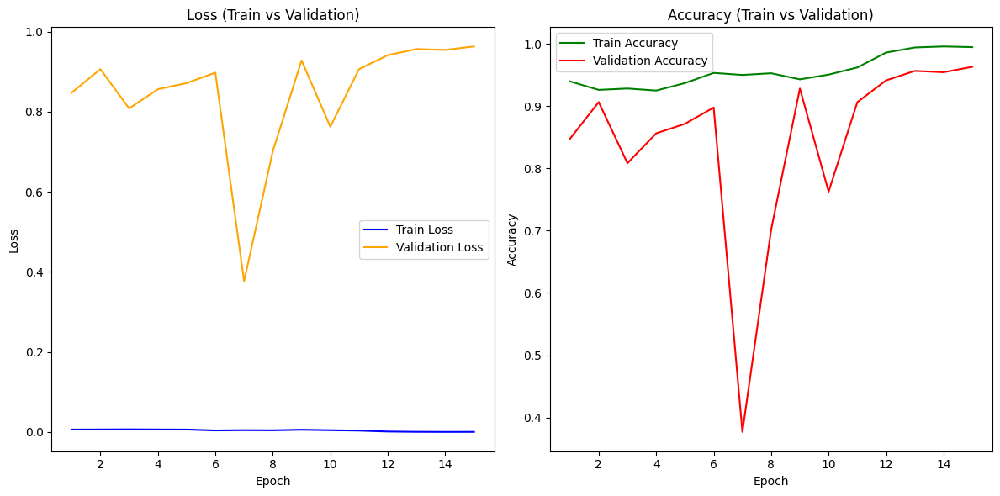

In [144]:
# antrenarea
max_epochs = 15
val_interval = 1
auc_metric = ROCAUCMetric()
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
scheduler = torch.optim.lr_scheduler.ReduceLROnPlateau(optimizer_2_5, mode='min', patience=3, factor=0.1, verbose=True)  # am folosit scheduler pentru a adjusta rata de invatare pentru ca sa ajung la o solutie mai buna si pentru o antrenare eficienta

results_per_fold = []

pair = train_ds_loader_list[2]
train_loader = pair[0]
val_loader = pair[1]

best_metric = -1
best_metric_epoch = -1
epoch_loss_values = []
metric_values = []
train_accuracy_values = []  # lista pentru acuratetea de antrenare
val_accuracy_values = []    # lista pentru acuratetea de validare
writer = SummaryWriter()

for epoch in range(max_epochs):
    print("-" * 10)
    print(f"epoch {epoch + 1}/{max_epochs}")
    model.train()
    epoch_loss = 0
    correct_train = 0  # numaram predictiile corecte pe setul de antrenare
    total_train = 0    # numaram exemplele totale
    step = 0
    for batch_data in train_loader:
        step += 1
        inputs, labels = batch_data[0].to(device), batch_data[1].to(device)
        # labels_onehot = torch.nn.functional.one_hot(labels, num_classes=4).float() # doar pentru cerinta 2.5 pentru BCE
        optimizer_2_5.zero_grad()
        outputs = model(inputs)
        loss = loss_function(outputs, labels)
        # loss = loss_function(outputs, labels_onehot) # doar pentru cerinta 2.5 pentru BCE
        loss.backward()
        optimizer_2_5.step()
        epoch_loss += loss.item()

        # calculam predictiile corecte pentru setul de antrenare
        _, preds = torch.max(outputs, 1)
        correct_train += (preds == labels).sum().item()
        total_train += labels.size(0)

        print(f"{step}/{len(train_ds) // train_loader.batch_size}, train_loss: {loss.item():.4f}")
        epoch_len = len(train_ds) // train_loader.batch_size
        writer.add_scalar("train_loss", loss.item(), epoch_len * epoch + step)
    epoch_loss /= step
    epoch_loss_values.append(epoch_loss)
    vals_for_plots_per_fold[f"fold_{fold + 1}"]["epoch_loss_values"].append(epoch_loss_values)

    # calculam acuratetea pe setul de antrenare
    train_accuracy = correct_train / total_train
    train_accuracy_values.append(train_accuracy)
    vals_for_plots_per_fold[f"fold_{fold + 1}"]["train_accuracy_values"].append(train_accuracy_values)
    print(f"epoch {epoch + 1} average loss: {epoch_loss:.4f}, train_accuracy: {train_accuracy:.4f}")

    if (epoch + 1) % val_interval == 0:
        model.eval()
        val_loss = 0
        correct_val = 0  # numaram predictiile corecte pe setul de validare
        total_val = 0    # numaram exemplele totale
        y_pred_class = []  # lista pentru predicții
        y_true_class = []  # lista pentru etichete reale

        with torch.no_grad():
            y_pred = torch.tensor([], dtype=torch.float32, device=device)
            y = torch.tensor([], dtype=torch.long, device=device)
            for val_data in val_loader:
                val_images, val_labels = (
                    val_data[0].to(device),
                    val_data[1].to(device),
                )
                # val_labels_onehot = torch.nn.functional.one_hot(val_labels, num_classes=4).float() # doar pentru cerinta 2.5 pentru BCE
                outputs = model(val_images)
                val_loss += loss_function(outputs, val_labels).item()
                # val_loss += loss_function(outputs, val_labels_onehot).item() # doar pentru cerinta 2.5 pentru BCE
                y_pred = torch.cat([y_pred, outputs], dim=0)
                y = torch.cat([y, val_labels], dim=0)

                # calculam predictiile corecte pentru setul de validare
                _, preds = torch.max(outputs, 1)
                y_pred_class.extend(preds.cpu().numpy())  # salvăm predicțiile
                y_true_class.extend(val_labels.cpu().numpy())  # salvăm etichetele reale
                correct_val += (preds == val_labels).sum().item()
                total_val += val_labels.size(0)

            val_loss /= len(val_loader)

            # calculam metricile de validare
            val_accuracy = correct_val / total_val
            val_accuracy_values.append(val_accuracy)
            vals_for_plots_per_fold[f"fold_{fold + 1}"]["val_accuracy_values"].append(val_accuracy_values)

            y_onehot = [y_trans(i) for i in decollate_batch(y, detach=False)]
            y_pred_act = [y_pred_trans(i) for i in decollate_batch(y_pred)]
            auc_metric(y_pred_act, y_onehot)
            result = auc_metric.aggregate()
            if f"Fold_0_scheduler" not in auc_per_fold_0_scheduler:
                auc_per_fold_0_scheduler[f"Fold_0_scheduler"] = []
            else:
                auc_per_fold_0_scheduler[f"Fold_0_scheduler"].append(result)
            auc_metric.reset()
            del y_pred_act, y_onehot
            metric_values.append(result)

            # verificam dacă este cea mai buna metrica
            if result > best_metric:
                best_metric = result
                best_metric_epoch = epoch + 1
                torch.save(model.state_dict(), os.path.join(root_dir, f"best_metric_model_fold_0_scheduler.pth"))
                print("saved new best metric model")
            print(
                f"current epoch: {epoch + 1} current AUC: {result:.4f}"
                f" current accuracy: {val_accuracy:.4f}"
                f" best AUC: {best_metric:.4f}"
                f" at epoch: {best_metric_epoch}"
            )
            writer.add_scalar("val_accuracy", val_accuracy, epoch + 1)
        scheduler.step(result)

print(f"Classification report for fold {fold + 1}:")
report = classification_report(y_true_class, y_pred_class, target_names=class_names_train, digits=4)
print(report)
results_per_fold.append(report)
writer.close()

# aici afisez prin grafice pierderea si aria under curve in functie de numarul de epoci pentru fiecare fold in parte
plt.figure(figsize=(12, 6))

# subgrafic pentru compararea pierderilor (Train vs Validation Loss)
plt.subplot(1, 2, 1)
plt.title(f"Loss (Train vs Validation)")
plt.plot(range(1, len(epoch_loss_values) + 1), epoch_loss_values, label="Train Loss", color="blue")
plt.plot(range(1, len(val_accuracy_values) + 1), [val_loss for val_loss in val_accuracy_values],
        label="Validation Loss", color="orange")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend()

# subgrafic pentru compararea acurateții (Train vs Validation Accuracy)
plt.subplot(1, 2, 2)
plt.title(f"Accuracy (Train vs Validation)")
plt.plot(range(1, len(train_accuracy_values) + 1), train_accuracy_values, label="Train Accuracy", color="green")
plt.plot(range(1, len(val_accuracy_values) + 1), val_accuracy_values, label="Validation Accuracy", color="red")
plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.legend()

plt.tight_layout()
plt.show()




In [145]:
test_auc_per_fold_0_scheduler = {}

In [146]:
model.load_state_dict(torch.load(os.path.join(root_dir, f"best_metric_model_fold_0_scheduler.pth")))
model.eval()

y_true = []
y_pred = []
y_probs = []  # Pentru scorurile probabilității necesare la calculul AUC

with torch.no_grad():
    for test_data in test_loader:
        test_images, test_labels = (
            test_data[0].to(device),
            test_data[1].to(device),
        )
        outputs = model(test_images)
        pred = outputs.argmax(dim=1)

        # Salvăm etichetele reale și predicțiile
        for i in range(len(pred)):
            y_true.append(test_labels[i].item())
            y_pred.append(pred[i].item())
        # Salvăm scorurile de probabilitate pentru calculul AUC
        y_probs.extend(outputs.cpu().numpy())

# Calculăm AUC pentru fold-ul curent
y_true_onehot = np.eye(len(class_names_train))[y_true]  # Convertim la format one-hot
auc = roc_auc_score(y_true_onehot, y_probs, multi_class="ovr")  # AUC OVR (One-vs-Rest)
test_auc_per_fold_0_scheduler[f"Fold_0"] = auc

# Afișăm raportul de clasificare și AUC pentru fold-ul curent
print(classification_report(y_true, y_pred, target_names=class_names_train, digits=4))
print(f"AUC for Fold 2 scheduler: {auc:.4f}")

# Calculăm media AUC pentru toate fold-urile
average_test_auc = sum(test_auc_per_fold_0_scheduler.values()) / len(test_auc_per_fold_0_scheduler)
print(f"\n======== Overall AUC on Test Set ========")
print(f"Average AUC: {average_test_auc:.4f}")


<ipython-input-146-73fd8cada716>:1: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(os.path.join(root_dir, f"best_metric_model_fold_0_schedule

                  precision    recall  f1-score   support

    glioma_tumor     1.0000    0.2200    0.3607       100
meningioma_tumor     0.6987    0.9478    0.8044       115
        no_tumor     0.6082    0.9905    0.7536       105
 pituitary_tumor     0.9778    0.5946    0.7395        74

        accuracy                         0.7081       394
       macro avg     0.8212    0.6882    0.6646       394
    weighted avg     0.8035    0.7081    0.6661       394

AUC for Fold 2 scheduler: 0.8773

======== Overall AUC on Test Set ========
Average AUC: 0.8773


EARLY STOPPING

In [147]:
class Early_Stopping():
    def __init__(self, patience=3, verbose=False):
        self.patience = patience
        self.verbose = verbose
        self.counter = 0
        self.best_score = None
        self.early_stop = False

    def save_checkpoint(self, model, path):
        torch.save(model.state_dict(), path)
        if self.verbose:
          print("model has been saved, starting a new checkpoint")

    def __call__(self, metric, model, path='checkpoint.pt'):
        if self.best_score is None:
            self.best_score = metric
        elif metric <= self.best_score: # daca nu s-a imbunatatit deloc performanta
            self.counter += 1
            if self.verbose:
                print(f'EarlyStopping counter: {self.counter} out of {self.patience}')
            if self.counter >= self.patience:
                self.early_stop = True
        else:
            self.best_score = metric
            self.counter = 0
            self.save_checkpoint(model, path)

In [148]:
auc_per_fold_0_early_stopping = {}

----------
epoch 1/15
1/28, train_loss: 0.0000
2/28, train_loss: 0.0003
3/28, train_loss: 0.0000
4/28, train_loss: 0.0001
5/28, train_loss: 0.0000
6/28, train_loss: 0.0003
7/28, train_loss: 0.0001
8/28, train_loss: 0.0003
9/28, train_loss: 0.0000
10/28, train_loss: 0.0000
11/28, train_loss: 0.0024
12/28, train_loss: 0.0000
13/28, train_loss: 0.0002
14/28, train_loss: 0.0003
15/28, train_loss: 0.0001
16/28, train_loss: 0.0001
17/28, train_loss: 0.0001
18/28, train_loss: 0.0004
19/28, train_loss: 0.0001
20/28, train_loss: 0.0002
21/28, train_loss: 0.0001
22/28, train_loss: 0.0001
23/28, train_loss: 0.0001
24/28, train_loss: 0.0001
25/28, train_loss: 0.0005
26/28, train_loss: 0.0001
27/28, train_loss: 0.0019
28/28, train_loss: 0.0001
29/28, train_loss: 0.0002
epoch 1 average loss: 0.0003, train_accuracy: 0.9984
saved new best metric model
current epoch: 1 current AUC: 0.9967 current accuracy: 0.9673 best AUC: 0.9967 at epoch: 1
----------
epoch 2/15
1/28, train_loss: 0.0001
2/28, train_lo

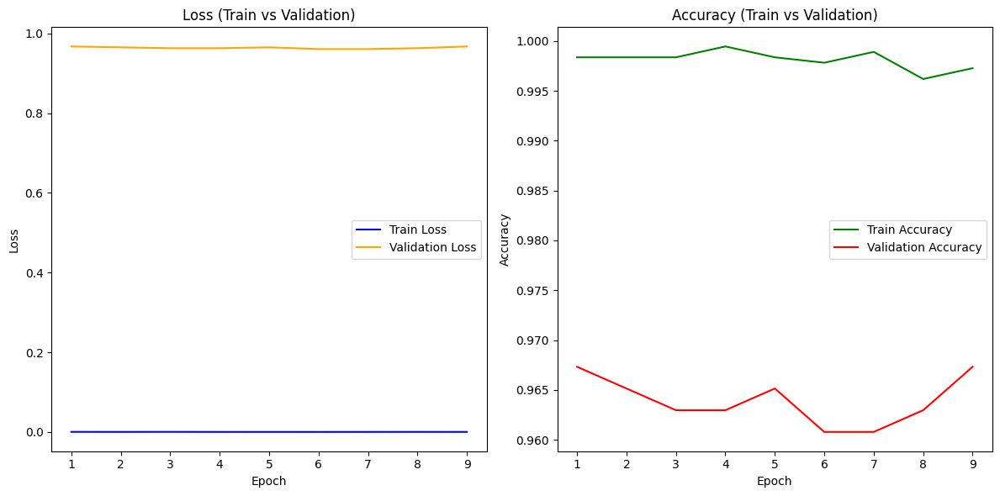

In [149]:
# antrenarea
max_epochs = 15
val_interval = 1
auc_metric = ROCAUCMetric()
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
early_stopping = Early_Stopping(patience=3, verbose=True)


results_per_fold = []

pair = train_ds_loader_list[2]
train_loader = pair[0]
val_loader = pair[1]

best_metric = -1
best_metric_epoch = -1
epoch_loss_values = []
metric_values = []
train_accuracy_values = []  # lista pentru acuratetea de antrenare
val_accuracy_values = []    # lista pentru acuratetea de validare
writer = SummaryWriter()

for epoch in range(max_epochs):
    print("-" * 10)
    print(f"epoch {epoch + 1}/{max_epochs}")
    model.train()
    epoch_loss = 0
    correct_train = 0  # numaram predictiile corecte pe setul de antrenare
    total_train = 0    # numaram exemplele totale
    step = 0
    for batch_data in train_loader:
        step += 1
        inputs, labels = batch_data[0].to(device), batch_data[1].to(device)
        # labels_onehot = torch.nn.functional.one_hot(labels, num_classes=4).float() # doar pentru cerinta 2.5 pentru BCE
        optimizer_2_5.zero_grad()
        outputs = model(inputs)
        loss = loss_function(outputs, labels)
        # loss = loss_function(outputs, labels_onehot) # doar pentru cerinta 2.5 pentru BCE
        loss.backward()
        optimizer_2_5.step()
        epoch_loss += loss.item()

        # calculam predictiile corecte pentru setul de antrenare
        _, preds = torch.max(outputs, 1)
        correct_train += (preds == labels).sum().item()
        total_train += labels.size(0)

        print(f"{step}/{len(train_ds) // train_loader.batch_size}, train_loss: {loss.item():.4f}")
        epoch_len = len(train_ds) // train_loader.batch_size
        writer.add_scalar("train_loss", loss.item(), epoch_len * epoch + step)
    epoch_loss /= step
    epoch_loss_values.append(epoch_loss)
    vals_for_plots_per_fold[f"fold_{fold + 1}"]["epoch_loss_values"].append(epoch_loss_values)

    # calculam acuratetea pe setul de antrenare
    train_accuracy = correct_train / total_train
    train_accuracy_values.append(train_accuracy)
    vals_for_plots_per_fold[f"fold_{fold + 1}"]["train_accuracy_values"].append(train_accuracy_values)
    print(f"epoch {epoch + 1} average loss: {epoch_loss:.4f}, train_accuracy: {train_accuracy:.4f}")

    if (epoch + 1) % val_interval == 0:
        model.eval()
        val_loss = 0
        correct_val = 0  # numaram predictiile corecte pe setul de validare
        total_val = 0    # numaram exemplele totale
        y_pred_class = []  # lista pentru predicții
        y_true_class = []  # lista pentru etichete reale

        with torch.no_grad():
            y_pred = torch.tensor([], dtype=torch.float32, device=device)
            y = torch.tensor([], dtype=torch.long, device=device)
            for val_data in val_loader:
                val_images, val_labels = (
                    val_data[0].to(device),
                    val_data[1].to(device),
                )
                # val_labels_onehot = torch.nn.functional.one_hot(val_labels, num_classes=4).float() # doar pentru cerinta 2.5 pentru BCE
                outputs = model(val_images)
                val_loss += loss_function(outputs, val_labels).item()
                # val_loss += loss_function(outputs, val_labels_onehot).item() # doar pentru cerinta 2.5 pentru BCE
                y_pred = torch.cat([y_pred, outputs], dim=0)
                y = torch.cat([y, val_labels], dim=0)

                # calculam predictiile corecte pentru setul de validare
                _, preds = torch.max(outputs, 1)
                y_pred_class.extend(preds.cpu().numpy())  # salvăm predicțiile
                y_true_class.extend(val_labels.cpu().numpy())  # salvăm etichetele reale
                correct_val += (preds == val_labels).sum().item()
                total_val += val_labels.size(0)

            val_loss /= len(val_loader)

            # calculam metricile de validare
            val_accuracy = correct_val / total_val
            val_accuracy_values.append(val_accuracy)
            vals_for_plots_per_fold[f"fold_{fold + 1}"]["val_accuracy_values"].append(val_accuracy_values)

            y_onehot = [y_trans(i) for i in decollate_batch(y, detach=False)]
            y_pred_act = [y_pred_trans(i) for i in decollate_batch(y_pred)]
            auc_metric(y_pred_act, y_onehot)
            result = auc_metric.aggregate()
            if f"Fold_{fold + 1}" not in auc_per_fold_0_early_stopping:
                auc_per_fold_0_early_stopping[f"Fold_0_early_stopping"] = []
            else:
                auc_per_fold_0_early_stopping[f"Fold_0_early_stopping"].append(result)
            auc_metric.reset()
            del y_pred_act, y_onehot
            metric_values.append(result)

            # verificam dacă este cea mai buna metrica
            if result > best_metric:
                best_metric = result
                best_metric_epoch = epoch + 1
                torch.save(model.state_dict(), os.path.join(root_dir, f"best_metric_model_fold_0_early_stopping.pth"))
                print("saved new best metric model")
            print(
                f"current epoch: {epoch + 1} current AUC: {result:.4f}"
                f" current accuracy: {val_accuracy:.4f}"
                f" best AUC: {best_metric:.4f}"
                f" at epoch: {best_metric_epoch}"
            )
            writer.add_scalar("val_accuracy", val_accuracy, epoch + 1)
            early_stopping(result, model, path='best_model_early_stopping.pth')

            if early_stopping.early_stop:
                print("Early stopping triggered!")
                break

print(f"Classification report for fold 0 early_stopping:")
report = classification_report(y_true_class, y_pred_class, target_names=class_names_train, digits=4)
print(report)
results_per_fold.append(report)
writer.close()

# aici afisez prin grafice pierderea si aria under curve in functie de numarul de epoci pentru fiecare fold in parte
plt.figure(figsize=(12, 6))

# subgrafic pentru compararea pierderilor (Train vs Validation Loss)
plt.subplot(1, 2, 1)
plt.title(f"Loss (Train vs Validation)")
plt.plot(range(1, len(epoch_loss_values) + 1), epoch_loss_values, label="Train Loss", color="blue")
plt.plot(range(1, len(val_accuracy_values) + 1), [val_loss for val_loss in val_accuracy_values],
        label="Validation Loss", color="orange")
plt.xlabel("Epoch")
plt.ylabel("Loss")
plt.legend()

# subgrafic pentru compararea acurateții (Train vs Validation Accuracy)
plt.subplot(1, 2, 2)
plt.title(f"Accuracy (Train vs Validation)")
plt.plot(range(1, len(train_accuracy_values) + 1), train_accuracy_values, label="Train Accuracy", color="green")
plt.plot(range(1, len(val_accuracy_values) + 1), val_accuracy_values, label="Validation Accuracy", color="red")
plt.xlabel("Epoch")
plt.ylabel("Accuracy")
plt.legend()

plt.tight_layout()
plt.show()




In [150]:
test_auc_per_fold_0_early_stopping = {}

In [151]:
model.load_state_dict(torch.load(os.path.join(root_dir, f"best_metric_model_fold_0_early_stopping.pth")))
model.eval()

y_true = []
y_pred = []
y_probs = []  # Pentru scorurile probabilității necesare la calculul AUC

with torch.no_grad():
    for test_data in test_loader:
        test_images, test_labels = (
            test_data[0].to(device),
            test_data[1].to(device),
        )
        outputs = model(test_images)
        pred = outputs.argmax(dim=1)

        # Salvăm etichetele reale și predicțiile
        for i in range(len(pred)):
            y_true.append(test_labels[i].item())
            y_pred.append(pred[i].item())
        # Salvăm scorurile de probabilitate pentru calculul AUC
        y_probs.extend(outputs.cpu().numpy())

# Calculăm AUC pentru fold-ul curent
y_true_onehot = np.eye(len(class_names_train))[y_true]  # Convertim la format one-hot
auc = roc_auc_score(y_true_onehot, y_probs, multi_class="ovr")  # AUC OVR (One-vs-Rest)
test_auc_per_fold_0_early_stopping[f"Fold_0"] = auc

# Afișăm raportul de clasificare și AUC pentru fold-ul curent
print(classification_report(y_true, y_pred, target_names=class_names_train, digits=4))
print(f"AUC early_stopping: {auc:.4f}")

# Calculăm media AUC pentru toate fold-urile
average_test_auc = sum(test_auc_per_fold_0_early_stopping.values()) / len(test_auc_per_fold_0_early_stopping)
print(f"\n======== Overall AUC on Test Set ========")
print(f"Average AUC: {average_test_auc:.4f}")


<ipython-input-151-0dc8ad8f0b0c>:1: FutureWarning: You are using `torch.load` with `weights_only=False` (the current default value), which uses the default pickle module implicitly. It is possible to construct malicious pickle data which will execute arbitrary code during unpickling (See https://github.com/pytorch/pytorch/blob/main/SECURITY.md#untrusted-models for more details). In a future release, the default value for `weights_only` will be flipped to `True`. This limits the functions that could be executed during unpickling. Arbitrary objects will no longer be allowed to be loaded via this mode unless they are explicitly allowlisted by the user via `torch.serialization.add_safe_globals`. We recommend you start setting `weights_only=True` for any use case where you don't have full control of the loaded file. Please open an issue on GitHub for any issues related to this experimental feature.
  model.load_state_dict(torch.load(os.path.join(root_dir, f"best_metric_model_fold_0_early_st

                  precision    recall  f1-score   support

    glioma_tumor     1.0000    0.2000    0.3333       100
meningioma_tumor     0.7315    0.9478    0.8258       115
        no_tumor     0.6012    0.9905    0.7482       105
 pituitary_tumor     0.9808    0.6892    0.8095        74

        accuracy                         0.7208       394
       macro avg     0.8284    0.7069    0.6792       394
    weighted avg     0.8117    0.7208    0.6771       394

AUC early_stopping: 0.8778

======== Overall AUC on Test Set ========
Average AUC: 0.8778
